#### Importing necessary libraries

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV,KFold,RandomizedSearchCV,cross_val_score,StratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,roc_auc_score,roc_curve
from sklearn.metrics import classification_report,confusion_matrix,log_loss
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from tensorflow.keras.layers import Dropout,Dense
from tensorflow.keras.models import Sequential
import tensorflow
import keras
import warnings
warnings.filterwarnings('ignore')

C:\Users\Admin\Anaconda3\lib\site-packages\tensorflow-2.0.0b1-py3.7-win-amd64.egg\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Admin\Anaconda3\lib\site-packages\tensorflow-2.0.0b1-py3.7-win-amd64.egg\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Admin\Anaconda3\lib\site-packages\tensorflow-2.0.0b1-py3.7-win-amd64.egg\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.i

#### Param for row and column

In [2]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

#### Importing the data 

In [3]:
path = os.getcwd()
for dirpath, dirnames, filenames in os.walk(path):
    print(filenames)    

['BFS_Capstone_Project.ipynb', 'BFS_Capstone_ProjectF.zip', 'BFS_Capstone_Project_mid.ipynb', 'Capstone_BFS.ipynb', 'Credit Bureau data.csv', 'Demographic data.csv', 'Mid-Submission BFSI Capstone Project.pdf', 'Mid-Submission BFSI Capstone Project.pptx']
['BFS_Capstone_Project-checkpoint.ipynb', 'Capstone_BFS-checkpoint.ipynb']
[]
['Assignment - Acquisition Analytics.ipynb', 'Assignment - Acquisition Analytics.pdf']
['BFS_Capstone_ProjectF.ipynb']
['BFS_Capstone_Project-checkpoint.ipynb']


In [4]:
# data_dict = pd.read_excel('Data+Dictionary_.xlsx')
cred_bureau = pd.read_csv('Credit Bureau data.csv')
demographics = pd.read_csv('Demographic data.csv')

#### Doing basic checks on the individual dataset

In [5]:
print(cred_bureau.shape)
print(demographics.shape)

(71295, 19)
(71295, 12)


In [6]:
cred_bureau.head()

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


In [7]:
demographics.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [8]:
cred_bureau.describe()

,Application ID,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
count,7.129500e+04,71295.000000,71295.000000,71295.000000,71295.000000,71295.000000,71295.000000,70237.000000,71294.000000,71295.000000,71295.000000,71295.000000,71295.000000,71295.000000,71023.000000,7.102300e+04,71295.000000,71295.000000,69870.000000
mean,4.989601e+08,0.270313,0.430535,0.577207,0.450340,0.655488,0.800912,29.696926,2.298048,5.826888,1.206901,2.397447,1.763532,3.535241,0.256424,1.249163e+06,8.186633,0.084620,0.042193
std,2.885905e+08,0.534166,0.825334,1.074436,0.808387,1.089535,1.331940,29.533308,2.070191,5.065096,1.352936,2.420086,1.971294,3.582199,0.436662,1.278874e+06,7.090776,0.278318,0.201030
min,1.004500e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.483719e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.115320e+05,3.000000,0.000000,0.000000
50%,4.975698e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,5.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.749920e+05,6.000000,0.000000,0.000000
75%,7.495868e+08,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,46.000000,3.000000,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.920796e+06,10.000000,0.000000,0.000000
max,1.000084e+09,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


In [9]:
demographics.describe()

,Application ID,Age,No of dependents,Income,No of months in current residence,No of months in current company,Performance Tag
count,7.129500e+04,71295.000000,71292.000000,71295.000000,71295.000000,71295.000000,69870.000000
mean,4.989601e+08,44.943039,2.865188,27.195224,34.563420,33.958244,0.042193
std,2.885905e+08,9.939211,1.382319,15.514626,36.759758,20.410824,0.201030
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000
25%,2.483719e+08,37.000000,2.000000,14.000000,6.000000,16.000000,0.000000
50%,4.975698e+08,45.000000,3.000000,27.000000,11.000000,34.000000,0.000000
75%,7.495868e+08,53.000000,4.000000,40.000000,60.000000,51.000000,0.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000


#### Merging the data on application ID columns

In [10]:
cred_master = demographics.merge(cred_bureau,how='inner',on='Application ID')

#### Also i can notice there is a extra space in Profession column name lets fix the issue

In [11]:
cred_master.rename(columns={'Profession ':'Profession'}, inplace=True)

In [12]:
cred_master_cpy = cred_master

In [13]:
cred_master.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag_x,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag_y
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


#### Doing basic checks on the merged dataframe

In [14]:
cred_master.shape

(71301, 30)

In [15]:
cred_master.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 71301 entries, 0 to 71300
Data columns (total 30 columns):
Application ID                                                     71301 non-null int64
Age                                                                71301 non-null int64
Gender                                                             71299 non-null object
Marital Status (at the time of application)                        71295 non-null object
No of dependents                                                   71298 non-null float64
Income                                                             71301 non-null float64
Education                                                          71182 non-null object
Profession                                                         71287 non-null object
Type of residence                                                  71293 non-null object
No of months in current residence                                  71301 non-null int64
No

In [16]:
cred_master.describe([0.25,0.50,0.75,0.99])

,Application ID,Age,No of dependents,Income,No of months in current residence,No of months in current company,Performance Tag_x,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag_y
count,7.130100e+04,71301.000000,71298.000000,71301.000000,71301.000000,71301.000000,69876.000000,71301.000000,71301.000000,71301.000000,71301.000000,71301.000000,71301.000000,70243.000000,71300.000000,71301.000000,71301.000000,71301.000000,71301.000000,71301.000000,71029.000000,7.102900e+04,71301.000000,71301.000000,69876.000000
mean,4.989767e+08,44.942694,2.865256,27.194450,34.564985,33.958780,0.042203,0.270319,0.430555,0.577243,0.450358,0.655517,0.800957,29.698504,2.297980,5.826721,1.206841,2.397414,1.763510,3.535210,0.256402,1.249092e+06,8.186379,0.084627,0.042203
std,2.885844e+08,9.939530,1.382308,15.514663,36.760727,20.411457,0.201054,0.534161,0.825330,1.074450,0.808402,1.089532,1.331953,29.534724,2.070136,5.064964,1.352902,2.420039,1.971232,3.582094,0.436650,1.278846e+06,7.090555,0.278328,0.201054
min,1.004500e+05,-3.000000,1.000000,-0.500000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,2.483824e+08,37.000000,2.000000,14.000000,6.000000,16.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.115220e+05,3.000000,0.000000,0.000000
50%,4.975977e+08,45.000000,3.000000,27.000000,11.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,2.000000,5.000000,1.000000,2.000000,1.000000,3.000000,0.000000,7.749850e+05,6.000000,0.000000,0.000000
75%,7.496040e+08,53.000000,4.000000,40.000000,60.000000,51.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,46.000000,3.000000,9.000000,2.000000,4.000000,3.000000,5.000000,1.000000,2.920753e+06,10.000000,0.000000,0.000000
99%,9.895329e+08,65.000000,5.000000,59.000000,122.000000,74.000000,1.000000,2.000000,3.000000,5.000000,3.000000,5.000000,6.000000,113.000000,9.000000,21.000000,5.000000,9.000000,8.000000,15.000000,1.000000,4.249691e+06,31.000000,1.000000,1.000000
max,1.000084e+09,65.000000,5.000000,60.000000,126.000000,133.000000,1.000000,3.000000,5.000000,7.000000,5.000000,7.000000,9.000000,113.000000,12.000000,28.000000,6.000000,12.000000,10.000000,20.000000,1.000000,5.218801e+06,44.000000,1.000000,1.000000


#### Immediately we can notice some issue with 'Age' & 'Income' column in both the cases it is showing -ve which is not possible

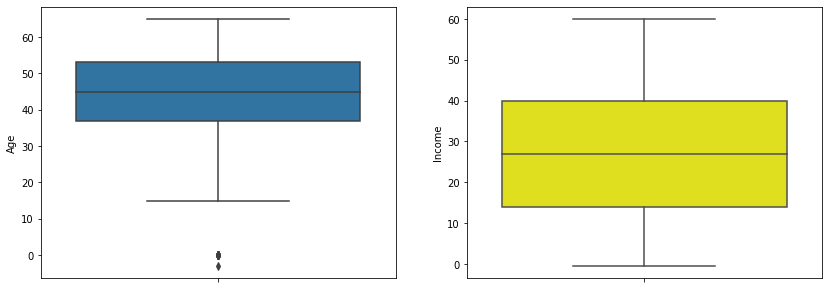

In [17]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
sns.boxplot(y = cred_master.Age)
plt.subplot(1,2,2)
sns.boxplot(y = cred_master.Income,color='yellow')
plt.show()

#### For this case i am going to repace the value which are  <0 with Q1 value for respective columns

In [18]:
cred_master.loc[cred_master.Income<0,'Income']=np.quantile(cred_master.Income,0.25)
cred_master.loc[cred_master.Age<=0,'Age']=np.quantile(cred_master.Age,0.25)

#### Lets check the uniqueness of the Application ID columns

In [19]:
cred_master[cred_master['Application ID'].duplicated()].groupby('Application ID')['Application ID'].count()+1

Application ID
653287861    4
671989187    4
765011468    4
Name: Application ID, dtype: int64

In [20]:
# Removing the duplicate value from the dataframe , It hard to decide which one is true dropping all~
cred_master = cred_master[~((cred_master['Application ID']==653287861) | (cred_master['Application ID']==671989187) | (cred_master['Application ID']==765011468))]

#### We donot need 2  'Performance Tag' in data frame so we are doiing to drop one of them but before dropping lets check after mering if these two columns are same or not

In [21]:
cred_master['ambiguity_status'] = cred_master['Performance Tag_x']==cred_master['Performance Tag_y']

In [22]:
cred_master[cred_master.ambiguity_status==False]

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag_x,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag_y,ambiguity_status
69609,906908303,35.0,M,Single,1.0,6.0,Bachelor,SAL,Rented,22,18,NaN,0,0,2,1,2,3,30.0,4.0,12,3,7,2,4,0.0,1309623.0,13,0,NaN,False
69610,10990583,47.0,F,Married,4.0,12.0,Masters,SE,Rented,122,25,NaN,1,1,1,3,2,2,16.0,3.0,7,3,4,3,5,0.0,775626.0,7,0,NaN,False
69611,589678446,46.0,M,Married,3.0,7.0,Professional,SE,Rented,10,31,NaN,3,4,5,3,5,6,83.0,2.0,7,2,4,0,3,0.0,732602.0,8,0,NaN,False
69612,809411322,41.0,M,Married,3.0,18.0,Masters,SAL,Rented,6,47,NaN,1,3,4,3,4,5,87.0,2.0,7,1,4,4,5,0.0,842057.0,8,0,NaN,False
69613,150246616,42.0,F,Married,4.0,17.0,Phd,SAL,Rented,8,49,NaN,2,2,4,3,2,6,42.0,3.0,7,2,3,3,6,0.0,786997.0,7,1,NaN,False
69614,216681850,46.0,M,Married,5.0,18.0,Bachelor,SE,Rented,61,72,NaN,2,2,3,2,2,5,25.0,1.0,5,1,4,1,4,0.0,980661.0,6,1,NaN,False
69615,413788459,29.0,M,Married,2.0,7.0,Professional,SE_PROF,Rented,38,18,NaN,1,2,3,3,3,4,42.0,2.0,4,1,2,1,2,0.0,363216.0,4,0,NaN,False
69616,666004143,57.0,M,Married,3.0,16.0,Professional,SAL,Rented,59,66,NaN,1,3,5,1,5,6,47.0,2.0,9,2,6,1,2,0.0,1178250.0,10,0,NaN,False
69617,505448697,39.0,F,Married,3.0,4.5,Bachelor,SAL,Rented,75,4,NaN,2,2,3,4,3,3,56.0,2.0,8,1,4,3,4,0.0,711895.0,9,0,NaN,False
69618,16819814,43.0,M,Married,4.0,24.0,Bachelor,SAL,Rented,6,3,NaN,2,2,3,3,3,3,49.0,4.0,10,3,5,3,5,0.0,1010968.0,11,0,NaN,False


In [23]:
# We can see both the columns are having same values so we can remove one of the column
cred_master = cred_master.drop(['Performance Tag_x','ambiguity_status'],axis='columns')
cred_master.rename(columns={'Performance Tag_y':'Performance Tag'}, inplace=True)

#### Now lets check the amount of nulls present in 'Performance Tag' as i am going to append this with validation set

In [24]:
cred_master['Performance Tag'].isnull().sum()

1425

In [25]:
# Lets create a separate dataframe to store these rows
null_p_tags = cred_master[cred_master['Performance Tag'].isnull()]
cred_master = cred_master[~cred_master['Performance Tag'].isnull()]

In [26]:
# Lets check the nulls in other columns
cred_master.isnull().sum()

Application ID                                                        0
Age                                                                   0
Gender                                                                2
Marital Status (at the time of application)                           6
No of dependents                                                      3
Income                                                                0
Education                                                           118
Profession                                                           13
Type of residence                                                     8
No of months in current residence                                     0
No of months in current company                                       0
No of times 90 DPD or worse in last 6 months                          0
No of times 60 DPD or worse in last 6 months                          0
No of times 30 DPD or worse in last 6 months                    

#### We can see there is significant number of missing values in dataframe lets try to impute them with WOE

In [27]:
cred_master_woe = cred_master

In [28]:
cred_master_woe.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,48.0,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31.0,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32.0,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43.0,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35.0,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


#### Lets impute the manually for the columns with null values

In [29]:
cred_master_woe_impute = cred_master_woe[list(cred_master_woe.isnull().sum()[cred_master_woe.isnull().sum()>0].index)]

In [30]:
cred_master_woe.isnull().sum()[cred_master_woe.isnull().sum()>0]

Gender                                            2
Marital Status (at the time of application)       6
No of dependents                                  3
Education                                       118
Profession                                       13
Type of residence                                 8
Avgas CC Utilization in last 12 months         1023
No of trades opened in last 6 months              1
Presence of open home loan                      272
Outstanding Balance                             272
dtype: int64

In [31]:
cred_master_woe.loc[cred_master_woe.Gender.isnull(),'Gender']='M'
cred_master_woe.loc[cred_master_woe['Marital Status (at the time of application)'].isnull(),'Marital Status (at the time of application)']='Married'
cred_master_woe.loc[cred_master_woe['No of dependents'].isnull(),'No of dependents']=3.0
cred_master_woe.loc[cred_master_woe.Education.isnull(),'Education']='Professional'
cred_master_woe.loc[cred_master_woe['Profession'].isnull(),'Profession']='SAL'
cred_master_woe.loc[cred_master_woe['Type of residence'].isnull(),'Type of residence']='Rented'
cred_master_woe.loc[cred_master_woe['No of trades opened in last 6 months'].isnull(),'No of trades opened in last 6 months']=1.0
cred_master_woe.loc[cred_master_woe['Presence of open home loan'].isnull(),'Presence of open home loan']=0.0


In [32]:
cred_master_woe_impute['Avgas CC Utilization in last 12 months'].fillna(value=0,inplace=True)
cred_master_woe_impute['Outstanding Balance'].fillna(value=0,inplace=True)

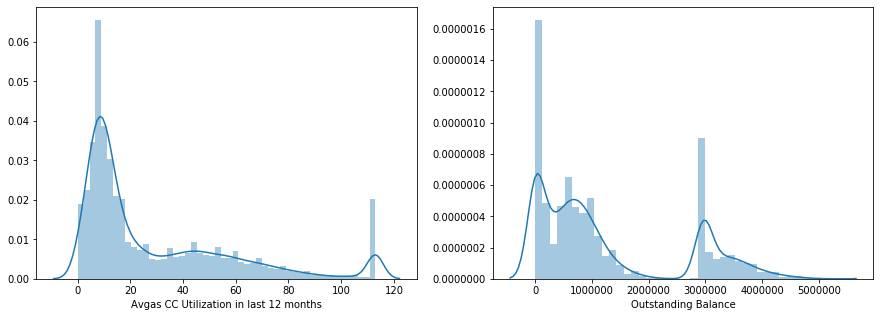

In [33]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.distplot(cred_master_woe_impute['Avgas CC Utilization in last 12 months'])
plt.subplot(1,2,2)
sns.distplot(cred_master_woe_impute['Outstanding Balance'])

#### As this distributions are skewed i am imputing with median()

In [34]:
cred_master_woe.loc[cred_master_woe['Outstanding Balance'].isnull(),'Outstanding Balance']=cred_master_woe['Outstanding Balance'].median()
cred_master_woe.loc[cred_master_woe['Avgas CC Utilization in last 12 months'].isnull(),'Avgas CC Utilization in last 12 months']=cred_master_woe['Avgas CC Utilization in last 12 months'].median()

In [35]:
# Updating the actual dataframe
cred_master = cred_master_woe

#### Creating WOE & IV calculation

In [36]:
cred_master_woe = cred_master_woe.drop('Application ID',axis='columns')

### Below woe creation function is taken from https://github.com/Sundar0989/WOE-and-IV/blob/master/WOE_IV.ipynb

In [37]:
# import packages
import pandas as pd
import numpy as np
import pandas.core.algorithms as algos
from pandas import Series
import scipy.stats.stats as stats
import re
import traceback
import string

max_bin = 20
force_bin = 3

# define a binning function
def mono_bin(Y, X, n = max_bin):
    
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X','Y']][df1.X.isnull()]
    notmiss = df1[['X','Y']][df1.X.notnull()]
    r = 0
    while np.abs(r) < 1:
        try:
            d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.qcut(notmiss.X, n)})
            d2 = d1.groupby('Bucket', as_index=True)
            r, p = stats.spearmanr(d2.mean().X, d2.mean().Y)
            n = n - 1 
        except Exception as e:
            n = n - 1

    if len(d2) == 1:
        n = force_bin         
        bins = algos.quantile(notmiss.X, np.linspace(0, 1, n))
        if len(np.unique(bins)) == 2:
            bins = np.insert(bins, 0, 1)
            bins[1] = bins[1]-(bins[1]/2)
        d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.cut(notmiss.X, np.unique(bins),include_lowest=True)}) 
        d2 = d1.groupby('Bucket', as_index=True)
    
    d3 = pd.DataFrame({},index=[])
    d3["MIN_VALUE"] = d2.min().X
    d3["MAX_VALUE"] = d2.max().X
    d3["COUNT"] = d2.count().Y
    d3["EVENT"] = d2.sum().Y
    d3["NONEVENT"] = d2.count().Y - d2.sum().Y
    d3=d3.reset_index(drop=True)
    
    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE':np.nan},index=[0])
        d4["MAX_VALUE"] = np.nan
        d4["COUNT"] = justmiss.count().Y
        d4["EVENT"] = justmiss.sum().Y
        d4["NONEVENT"] = justmiss.count().Y - justmiss.sum().Y
        d3 = d3.append(d4,ignore_index=True)
    
    d3["EVENT_RATE"] = d3.EVENT/d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT/d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT/d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT/d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME','MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE', 'DIST_EVENT','DIST_NON_EVENT','WOE', 'IV']]       
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
    
    return(d3)

def char_bin(Y, X):
        
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X','Y']][df1.X.isnull()]
    notmiss = df1[['X','Y']][df1.X.notnull()]    
    df2 = notmiss.groupby('X',as_index=True)
    
    d3 = pd.DataFrame({},index=[])
    d3["COUNT"] = df2.count().Y
    d3["MIN_VALUE"] = df2.sum().Y.index
    d3["MAX_VALUE"] = d3["MIN_VALUE"]
    d3["EVENT"] = df2.sum().Y
    d3["NONEVENT"] = df2.count().Y - df2.sum().Y
    
    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE':np.nan},index=[0])
        d4["MAX_VALUE"] = np.nan
        d4["COUNT"] = justmiss.count().Y
        d4["EVENT"] = justmiss.sum().Y
        d4["NONEVENT"] = justmiss.count().Y - justmiss.sum().Y
        d3 = d3.append(d4,ignore_index=True)
    
    d3["EVENT_RATE"] = d3.EVENT/d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT/d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT/d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT/d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME','MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE', 'DIST_EVENT','DIST_NON_EVENT','WOE', 'IV']]      
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
    d3 = d3.reset_index(drop=True)
    
    return(d3)

def data_vars(df1, target):
    
    stack = traceback.extract_stack()
    filename, lineno, function_name, code = stack[-2]
    vars_name = re.compile(r'\((.*?)\).*$').search(code).groups()[0]
    final = (re.findall(r"[\w']+", vars_name))[-1]
    
    x = df1.dtypes.index
    count = -1
    
    for i in x:
        if i.upper() not in (final.upper()):
            if np.issubdtype(df1[i], np.number) and len(Series.unique(df1[i])) > 2:
                conv = mono_bin(target, df1[i])
                conv["VAR_NAME"] = i
                count = count + 1
            else:
                conv = char_bin(target, df1[i])
                conv["VAR_NAME"] = i            
                count = count + 1
                
            if count == 0:
                iv_df = conv
            else:
                iv_df = iv_df.append(conv,ignore_index=True)
    
    iv = pd.DataFrame({'IV':iv_df.groupby('VAR_NAME').IV.max()})
    iv = iv.reset_index()
    return(iv_df,iv)


In [38]:
final_iv, IV = data_vars(cred_master_woe,cred_master_woe['Performance Tag'])

In [39]:
final_iv

,VAR_NAME,MIN_VALUE,MAX_VALUE,COUNT,EVENT,EVENT_RATE,NONEVENT,NON_EVENT_RATE,DIST_EVENT,DIST_NON_EVENT,WOE,IV
0,Age,15,40,24634,1071.0,0.043476,23563.0,0.956524,0.363420,0.352123,0.031580,0.000625
1,Age,41,50,22872,958.0,0.041885,21914.0,0.958115,0.325076,0.327480,-0.007368,0.000625
2,Age,51,65,22358,918.0,0.041059,21440.0,0.958941,0.311503,0.320397,-0.028151,0.000625
3,Gender,F,F,16506,718.0,0.043499,15788.0,0.956501,0.243638,0.235934,0.032129,0.000326
4,Gender,M,M,53358,2229.0,0.041774,51129.0,0.958226,0.756362,0.764066,-0.010133,0.000326
5,Marital Status (at the time of application),Married,Married,59548,2502.0,0.042017,57046.0,0.957983,0.848999,0.852489,-0.004102,0.000096
6,Marital Status (at the time of application),Single,Single,10316,445.0,0.043137,9871.0,0.956863,0.151001,0.147511,0.023383,0.000096
7,No of dependents,1,3,45992,1950.0,0.042399,44042.0,0.957601,0.661690,0.658159,0.005351,0.000056
8,No of dependents,4,5,23872,997.0,0.041764,22875.0,0.958236,0.338310,0.341841,-0.010384,0.000056
9,Income,0,14,18040,951.0,0.052716,17089.0,0.947284,0.322701,0.255376,0.233989,0.032533


In [40]:
IV = IV.sort_values('IV',ascending=False)
IV

,VAR_NAME,IV
1,Avgas CC Utilization in last 12 months,0.287537
19,No of trades opened in last 12 months,0.257429
6,No of Inquiries in last 12 months (excluding h...,0.229218
26,Total No of Trades,0.189907
13,No of times 30 DPD or worse in last 12 months,0.188045
8,No of PL trades opened in last 12 months,0.176644
14,No of times 30 DPD or worse in last 6 months,0.145708
15,No of times 60 DPD or worse in last 12 months,0.137676
9,No of PL trades opened in last 6 months,0.124744
17,No of times 90 DPD or worse in last 12 months,0.095714


#### Lets plot a graph showing the rank and predicting power of the independent variable

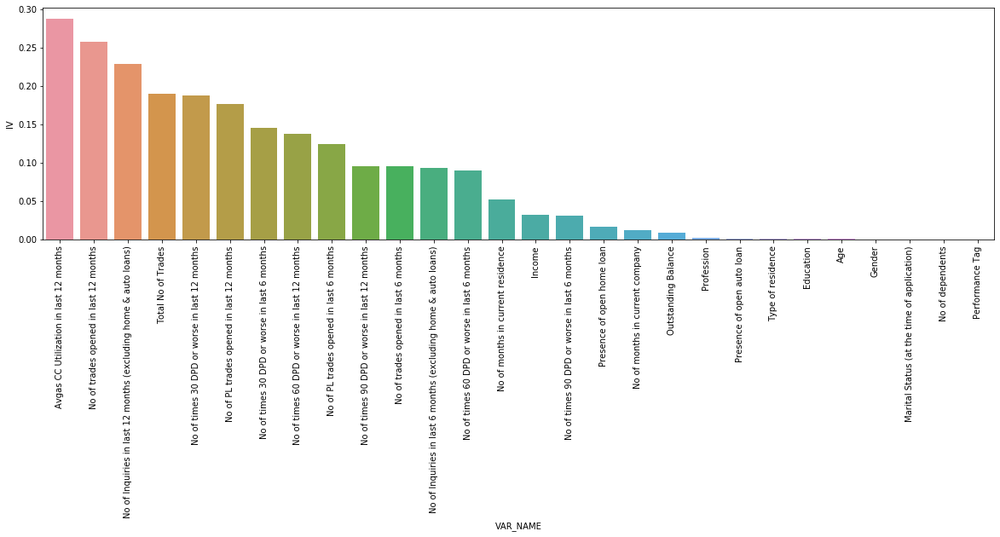

In [41]:
plt.figure(figsize=(20,5))
sns.barplot(IV.VAR_NAME,IV.IV)
plt.xticks(rotation=90)
plt.show()

In [42]:
transform_vars_list = cred_master_woe.columns.difference(['Performance Tag'])
# transform_prefix = 'new_' # leave this value blank if you need replace the original column values
transform_prefix = ''

In [43]:
transform_vars_list

Index(['Age', 'Avgas CC Utilization in last 12 months', 'Education', 'Gender', 'Income', 'Marital Status (at the time of application)', 'No of Inquiries in last 12 months (excluding home & auto loans)', 'No of Inquiries in last 6 months (excluding home & auto loans)', 'No of PL trades opened in last 12 months', 'No of PL trades opened in last 6 months', 'No of dependents', 'No of months in current company', 'No of months in current residence', 'No of times 30 DPD or worse in last 12 months', 'No of times 30 DPD or worse in last 6 months', 'No of times 60 DPD or worse in last 12 months', 'No of times 60 DPD or worse in last 6 months', 'No of times 90 DPD or worse in last 12 months', 'No of times 90 DPD or worse in last 6 months', 'No of trades opened in last 12 months', 'No of trades opened in last 6 months', 'Outstanding Balance', 'Presence of open auto loan', 'Presence of open home loan', 'Profession', 'Total No of Trades', 'Type of residence'], dtype='object')

In [44]:
for var in transform_vars_list:
    small_df = final_iv[final_iv['VAR_NAME'] == var]
    transform_dict = dict(zip(small_df.MAX_VALUE,small_df.WOE))
    replace_cmd = ''
    replace_cmd1 = ''
    for i in sorted(transform_dict.items()):
        replace_cmd = replace_cmd + str(i[1]) + str(' if x <= ') + str(i[0]) + ' else '
        replace_cmd1 = replace_cmd1 + str(i[1]) + str(' if x == "') + str(i[0]) + '" else '
    replace_cmd = replace_cmd + '0'
    replace_cmd1 = replace_cmd1 + '0'
    if replace_cmd != '0':
        try:
            cred_master_woe[transform_prefix + var] = cred_master_woe[var].apply(lambda x: eval(replace_cmd))
        except:
            cred_master_woe[transform_prefix + var] = cred_master_woe[var].apply(lambda x: eval(replace_cmd1))

#### We got our final woe replaced dataset lets analyze the with this data

In [45]:
cred_master_woe.sample(5)

,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
8247,0.031580,0.032129,-0.004102,0.005351,-0.110416,0.007904,-0.028375,0.004104,-0.252890,0.167150,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.522960,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,0.071794,-0.095262,-0.686175,0.011973,0.0
24744,0.031580,-0.010133,-0.004102,-0.010384,-0.110416,0.007904,-0.028375,-0.004479,-0.252890,-0.073182,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.522960,-0.270769,0.228323,-0.314635,-0.453113,-0.320076,0.182735,0.071794,-0.095262,0.210325,0.011973,0.0
55891,-0.007368,-0.010133,-0.004102,0.005351,0.233989,0.007904,0.091379,-0.004479,0.206757,-0.073182,-0.036826,-0.121396,0.742906,0.722079,0.694138,0.710255,0.358297,0.354912,0.368415,0.400627,0.395652,0.292629,0.368408,0.071794,0.088272,0.332417,0.011973,0.0
6327,-0.007368,-0.010133,-0.004102,0.005351,-0.251315,-0.017823,-0.028375,-0.004479,0.206757,0.167150,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.798937,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,0.071794,-0.095262,-0.686175,0.011973,0.0
64102,0.031580,-0.010133,0.023383,0.005351,0.046772,0.017390,-0.028375,-0.004479,0.206757,0.167150,-0.036826,-0.121396,0.742906,-0.133612,0.694138,0.710255,0.503393,0.354912,0.368415,0.400627,0.395652,0.292629,0.368408,0.071794,0.088272,0.332417,0.011973,0.0


In [46]:
# Function to understand the relationship of independent variable with response variable
def analize(independent,response):
    No_of_prospect =cred_master.groupby(cred_master[independent])[response].count().reset_index(name='No.of_prospect')
    count_prospects=cred_master[cred_master[response]==1].groupby(cred_master[cred_master[response]==1][independent])[response].count().reset_index(name='count_prospects')
    agg_r = No_of_prospect.merge(count_prospects,on=independent)
    agg_r['response_rate'] = 100*(agg_r['count_prospects']/agg_r['No.of_prospect']).round(3)
    print('\033[1m'+'Analysis in table format'+'\033[1m')
    print(pd.DataFrame(agg_r))
    plt.title('Analysis of {0}'.format(independent))
    ax = sns.barplot(x=agg_r[independent], y='response_rate', data=agg_r)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    plt.show()

#### Before Starting modeling lets do some EDA on the actual values

In [47]:
bins = np.arange(10,cred_master.Age.max()+10,10)
cred_master['Age_Bins'] = pd.cut(cred_master.Age,bins=bins,include_lowest=True)

Analysis in table format
        Age_Bins  No.of_prospect  count_prospects  response_rate
0  (9.999, 20.0]             121                3            2.5
1   (20.0, 30.0]            5805              238            4.1
2   (30.0, 40.0]           18708              830            4.4
3   (40.0, 50.0]           22872              958            4.2
4   (50.0, 60.0]           17533              718            4.1
5   (60.0, 70.0]            4825              200            4.1


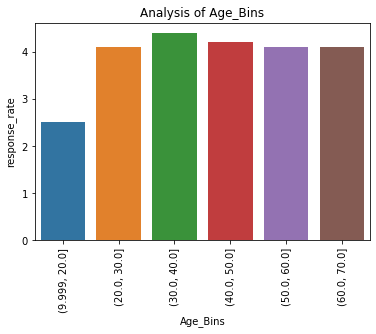

In [48]:
analize('Age_Bins','Performance Tag')

#### It seems the age group of [30-50] are more likely responsible for credit loss

Analysis in table format
  Gender  No.of_prospect  count_prospects  response_rate
0      F           16506              718            4.3
1      M           53358             2229            4.2


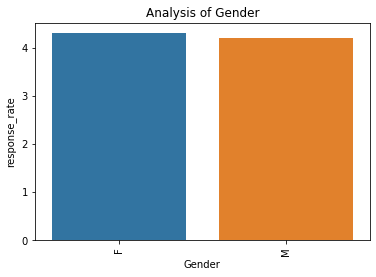

In [49]:
analize('Gender','Performance Tag')

Analysis in table format
  Marital Status (at the time of application)  No.of_prospect  count_prospects  response_rate
0                                     Married           59548             2502            4.2
1                                      Single           10316              445            4.3


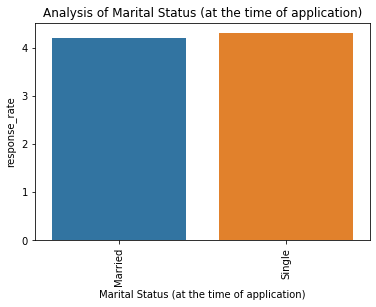

In [50]:
analize('Marital Status (at the time of application)','Performance Tag')

#### Here we can see that single people are more likely to default

Analysis in table format
   No of dependents  No.of_prospect  count_prospects  response_rate
0               1.0           15218              667            4.4
1               2.0           15127              588            3.9
2               3.0           15647              695            4.4
3               4.0           11997              494            4.1
4               5.0           11875              503            4.2


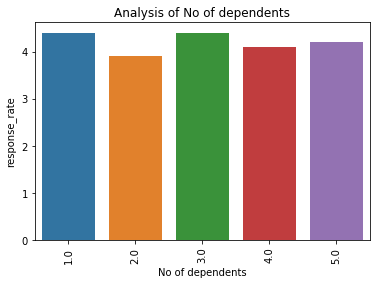

In [51]:
analize('No of dependents','Performance Tag')

#### No of dependent 1,3 are more likely to default on 

Analysis in table format
      Income_Bin  No.of_prospect  count_prospects  response_rate
0  (9.999, 20.0]           14765              685            4.6
1   (20.0, 30.0]           13586              601            4.4
2   (30.0, 40.0]           13634              484            3.5
3   (40.0, 50.0]           10844              384            3.5
4   (50.0, 60.0]            5612              161            2.9


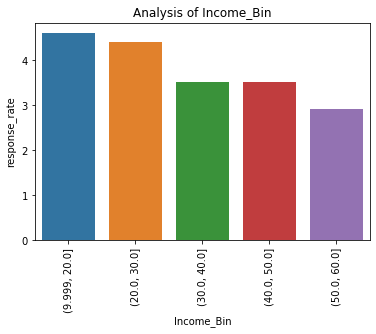

In [52]:
bins = np.arange(10,cred_master.Income.max()+10,10)
cred_master['Income_Bin'] = pd.cut(cred_master.Income,bins=bins,include_lowest=True)
analize('Income_Bin','Performance Tag')

#### Here we can see that the people with low income are more likely to default on credit

Analysis in table format
      Education  No.of_prospect  count_prospects  response_rate
0      Bachelor           17300              742            4.3
1       Masters           23481              998            4.3
2        Others             119                8            6.7
3           Phd            4463              183            4.1
4  Professional           24501             1016            4.1


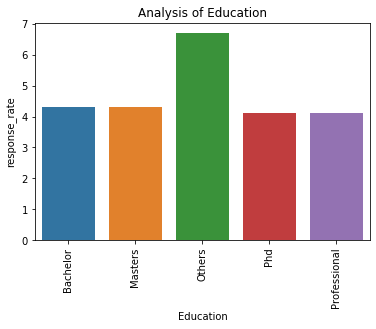

In [53]:
analize('Education','Performance Tag')

#### It seems others are uneducated people who are responsible for a credit loss

Analysis in table format
  Profession  No.of_prospect  count_prospects  response_rate
0        SAL           39683             1629            4.1
1         SE           13925              641            4.6
2    SE_PROF           16256              677            4.2


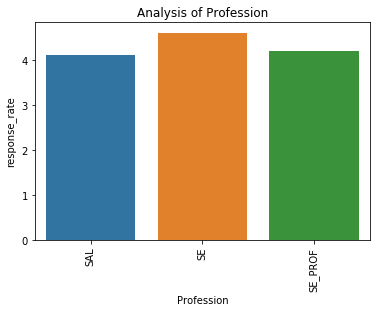

In [54]:
analize('Profession','Performance Tag')

Analysis in table format
     Type of residence  No.of_prospect  count_prospects  response_rate
0     Company provided            1602               73            4.6
1  Living with Parents            1777               80            4.5
2               Others             198                5            2.5
3                Owned           14003              593            4.2
4               Rented           52284             2196            4.2


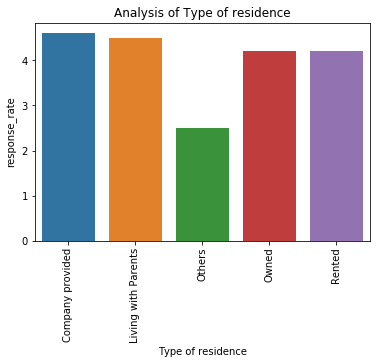

In [55]:
analize('Type of residence','Performance Tag')

Analysis in table format
   No of months in current residence bin  No.of_prospect  count_prospects  response_rate
0                          (4.999, 15.0]           37026             1289            3.5
1                           (15.0, 25.0]            3577              234            6.5
2                           (25.0, 35.0]            3521              224            6.4
3                           (35.0, 45.0]            3416              181            5.3
4                           (45.0, 55.0]            3235              189            5.8
5                           (55.0, 65.0]            2989              137            4.6
6                           (65.0, 75.0]            2892              120            4.1
7                           (75.0, 85.0]            2802              144            5.1
8                           (85.0, 95.0]            2765              124            4.5
9                          (95.0, 105.0]            2790              109            

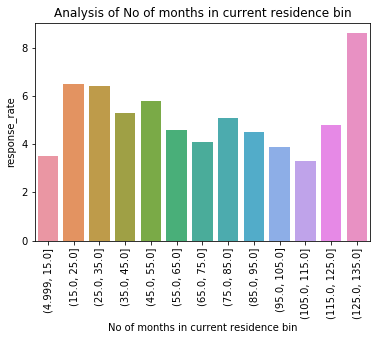

In [56]:
bins = np.arange(5,cred_master['No of months in current residence'].max()+10,10)
cred_master['No of months in current residence bin'] = pd.cut(cred_master['No of months in current residence'],bins=bins,
                                                             include_lowest=True)
analize('No of months in current residence bin','Performance Tag')

Analysis in table format
   No of months in current company bin  No.of_prospect  count_prospects  response_rate
0                        (4.999, 15.0]           10768              551            5.1
1                         (15.0, 25.0]            9888              469            4.7
2                         (25.0, 35.0]           10106              407            4.0
3                         (35.0, 45.0]           10411              408            3.9
4                         (45.0, 55.0]           10267              369            3.6
5                         (55.0, 65.0]            8102              282            3.5
6                         (65.0, 75.0]            4637              218            4.7
7                         (75.0, 85.0]               1                0            0.0
8                         (85.0, 95.0]               1                0            0.0
9                        (95.0, 105.0]               3                0            0.0
10                

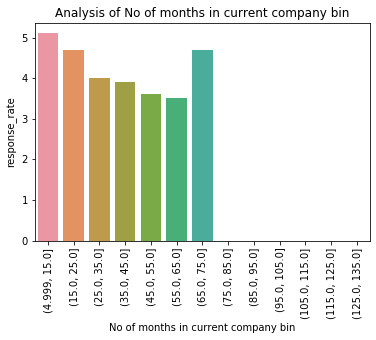

In [57]:
bins = np.arange(5,cred_master['No of months in current company'].max()+10,10)
cred_master['No of months in current company bin'] = pd.cut(cred_master['No of months in current company'],bins=bins,
                                                             include_lowest=True)
analize('No of months in current company bin','Performance Tag')

Analysis in table format
   Presence of open home loan  No.of_prospect  count_prospects  response_rate
0                         0.0           51793             2340            4.5
1                         1.0           18071              607            3.4


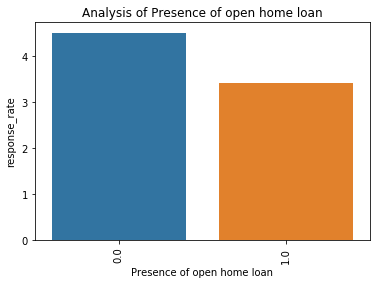

In [58]:
analize('Presence of open home loan','Performance Tag')

Analysis in table format
   Outstanding Balance bin  No.of_prospect  count_prospects  response_rate
0  (599999.999, 1200000.0]           18671             1190            6.4
1   (1200000.0, 1800000.0]            3804              182            4.8
2   (1800000.0, 2400000.0]             310                9            2.9
3   (2400000.0, 3000000.0]            8212              130            1.6
4   (3000000.0, 3600000.0]            5936              255            4.3
5   (3600000.0, 4200000.0]            3058              173            5.7
6   (4200000.0, 4800000.0]             803               42            5.2


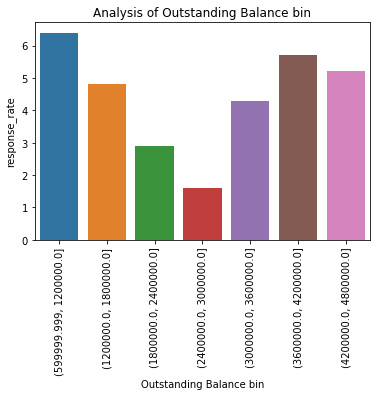

In [59]:
bins = np.arange(600000,cred_master['Outstanding Balance'].max()+100000,600000)
cred_master['Outstanding Balance bin'] = pd.cut(cred_master['Outstanding Balance'],bins=bins,
                                                             include_lowest=True)
analize('Outstanding Balance bin','Performance Tag')

Analysis in table format
    Total No of Trades  No.of_prospect  count_prospects  response_rate
0                    0             988               42            4.3
1                    1            2926               44            1.5
2                    2            6765              106            1.6
3                    3            8614              184            2.1
4                    4            7490              205            2.7
5                    5            5714              230            4.0
6                    6            4966              237            4.8
7                    7            4827              270            5.6
8                    8            4533              296            6.5
9                    9            3906              282            7.2
10                  10            3227              221            6.8
11                  11            2503              163            6.5
12                  12            1831              

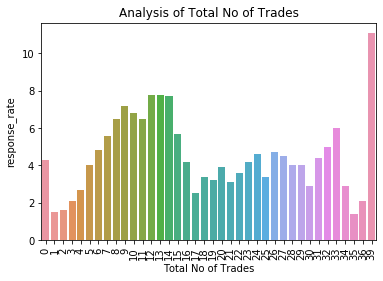

In [60]:
analize('Total No of Trades','Performance Tag')

Analysis in table format
   Presence of open auto loan  No.of_prospect  count_prospects  response_rate
0                           0           63935             2728            4.3
1                           1            5929              219            3.7


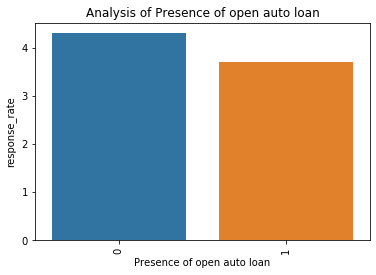

In [61]:
analize('Presence of open auto loan','Performance Tag')

In [62]:
cred_master = cred_master.drop(['Age_Bins','Income_Bin',
                                'No of months in current residence bin','No of months in current company bin',
                                'Outstanding Balance bin'],axis='columns')

In [63]:
cred_master

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,48.0,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31.0,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32.0,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43.0,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35.0,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0
5,312196805,20.0,M,Married,1.0,39.0,Bachelor,SAL,Rented,116,52,0,0,0,0,0,0,10.0,0.0,0,0,0,0,0,0.0,2569.0,1,0,0.0
6,532217204,42.0,M,Married,2.0,55.0,Professional,SAL,Rented,104,41,0,0,0,0,0,0,11.0,0.0,1,0,0,0,0,1.0,3005535.0,4,0,0.0
7,74788849,34.0,M,Married,2.0,49.0,Masters,SE_PROF,Rented,108,40,0,0,0,0,0,0,13.0,1.0,1,0,0,0,0,1.0,3004790.0,3,0,0.0
8,782743811,30.0,M,Married,3.0,48.0,Phd,SAL,Rented,115,58,0,0,0,0,0,1,9.0,0.0,0,0,0,0,0,1.0,3007428.0,2,0,0.0
9,96964957,22.0,M,Single,1.0,38.0,Bachelor,SE_PROF,Rented,111,57,0,0,0,0,0,0,6.0,1.0,1,0,0,0,0,0.0,170860.0,1,1,0.0


In [64]:
cred_master.columns

Index(['Application ID', 'Age', 'Gender', 'Marital Status (at the time of application)', 'No of dependents', 'Income', 'Education', 'Profession', 'Type of residence', 'No of months in current residence', 'No of months in current company', 'No of times 90 DPD or worse in last 6 months', 'No of times 60 DPD or worse in last 6 months', 'No of times 30 DPD or worse in last 6 months', 'No of times 90 DPD or worse in last 12 months', 'No of times 60 DPD or worse in last 12 months', 'No of times 30 DPD or worse in last 12 months', 'Avgas CC Utilization in last 12 months', 'No of trades opened in last 6 months', 'No of trades opened in last 12 months', 'No of PL trades opened in last 6 months', 'No of PL trades opened in last 12 months', 'No of Inquiries in last 6 months (excluding home & auto loans)', 'No of Inquiries in last 12 months (excluding home & auto loans)', 'Presence of open home loan', 'Outstanding Balance', 'Total No of Trades', 'Presence of open auto loan', 'Performance Tag'], dt

Analysis in table format
   No of times 30 DPD or worse in last 6 months  No.of_prospect  count_prospects  response_rate
0                                             0           50096             1455            2.9
1                                             1            9500              622            6.5
2                                             2            5897              466            7.9
3                                             3            2829              245            8.7
4                                             4            1045              107           10.2
5                                             5             386               43           11.1
6                                             6              96                8            8.3
7                                             7              15                1            6.7


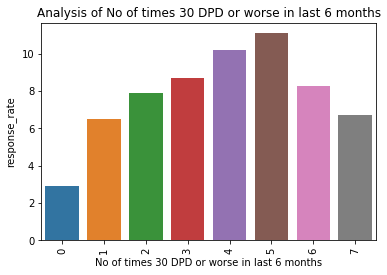

In [65]:
analize('No of times 30 DPD or worse in last 6 months','Performance Tag')

Analysis in table format
   No of times 60 DPD or worse in last 6 months  No.of_prospect  count_prospects  response_rate
0                                             0           51868             1582            3.1
1                                             1           11130              783            7.0
2                                             2            4916              389            7.9
3                                             3            1469              148           10.1
4                                             4             411               39            9.5
5                                             5              70                6            8.6


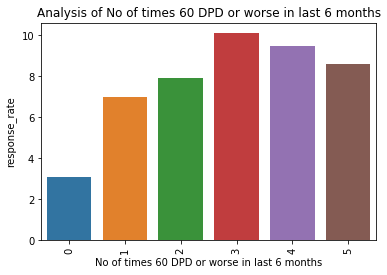

In [66]:
analize('No of times 60 DPD or worse in last 6 months','Performance Tag')

Analysis in table format
   No of times 90 DPD or worse in last 6 months  No.of_prospect  count_prospects  response_rate
0                                             0           54662             1794            3.3
1                                             1           13218              970            7.3
2                                             2            1776              160            9.0
3                                             3             208               23           11.1


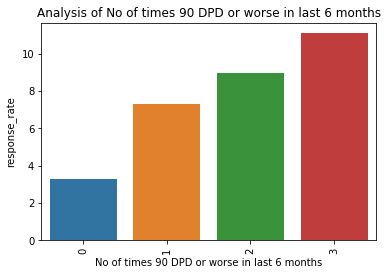

In [67]:
analize('No of times 90 DPD or worse in last 6 months','Performance Tag')

Analysis in table format
   No of times 30 DPD or worse in last 12 months  No.of_prospect  count_prospects  response_rate
0                                              0           44855             1316            2.9
1                                              1           11474              518            4.5
2                                              2            6116              451            7.4
3                                              3            4135              349            8.4
4                                              4            1924              173            9.0
5                                              5             853               89           10.4
6                                              6             376               38           10.1
7                                              7             107               11           10.3
8                                              8              23                2            8.7


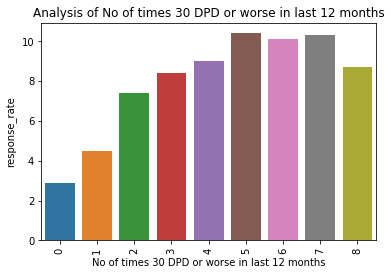

In [68]:
analize('No of times 30 DPD or worse in last 12 months','Performance Tag')

Analysis in table format
   No of times 60 DPD or worse in last 12 months  No.of_prospect  count_prospects  response_rate
0                                              0           45866             1378            3.0
1                                              1           12816              663            5.2
2                                              2            6413              482            7.5
3                                              3            3205              274            8.5
4                                              4            1048              101            9.6
5                                              5             398               36            9.0
6                                              6             111               13           11.7


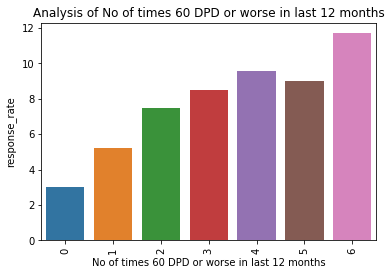

In [69]:
analize('No of times 60 DPD or worse in last 12 months','Performance Tag')

Analysis in table format
   No of times 90 DPD or worse in last 12 months  No.of_prospect  count_prospects  response_rate
0                                              0           50490             1510            3.0
1                                              1           11663              796            6.8
2                                              2            6159              488            7.9
3                                              3            1244              120            9.6
4                                              4             272               28           10.3
5                                              5              36                5           13.9


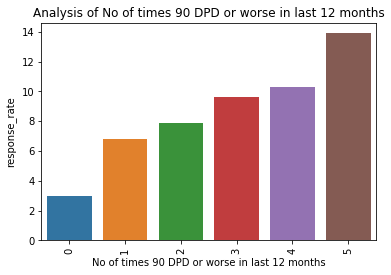

In [70]:
analize('No of times 90 DPD or worse in last 12 months','Performance Tag')

Analysis in table format
   No of PL trades opened in last 6 months  No.of_prospect  count_prospects  response_rate
0                                        0           31078              699            2.2
1                                        1           13545              691            5.1
2                                        2           12565              803            6.4
3                                        3            7949              501            6.3
4                                        4            3341              197            5.9
5                                        5            1090               48            4.4
6                                        6             296                8            2.7


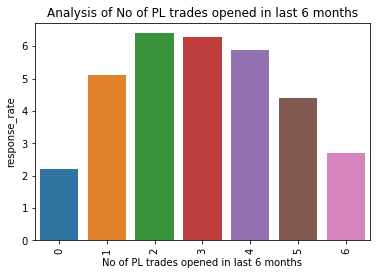

In [71]:
analize('No of PL trades opened in last 6 months','Performance Tag')

Analysis in table format
    No of Inquiries in last 6 months (excluding home & auto loans)  No.of_prospect  count_prospects  response_rate
0                                                   0                        25068              527            2.1
1                                                   1                        13175              658            5.0
2                                                   2                        12830              665            5.2
3                                                   3                         7257              517            7.1
4                                                   4                         4248              269            6.3
5                                                   5                         3019              150            5.0
6                                                   6                         1750               73            4.2
7                                                   7  

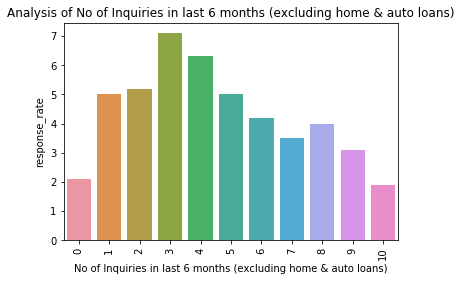

In [72]:
analize('No of Inquiries in last 6 months (excluding home & auto loans)','Performance Tag')

Analysis in table format
    No of Inquiries in last 12 months (excluding home & auto loans)  No.of_prospect  count_prospects  response_rate
0                                                   0                         20580              307            1.5
1                                                   1                          3899              155            4.0
2                                                   2                          7906              382            4.8
3                                                   3                          8978              443            4.9
4                                                   4                          7113              380            5.3
5                                                   5                          4926              362            7.3
6                                                   6                          3614              247            6.8
7                                              

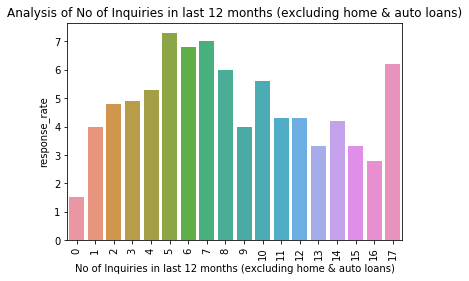

In [73]:
analize('No of Inquiries in last 12 months (excluding home & auto loans)','Performance Tag')

Analysis in table format
      Outstanding Balance  No.of_prospect  count_prospects  response_rate
0                     0.0             809               36            4.4
1                   138.0               3                1           33.3
2                   150.0               1                1          100.0
3                   310.0               2                1           50.0
4                   341.0               2                1           50.0
5                   359.0               2                1           50.0
6                   397.0               2                1           50.0
7                   569.0               2                1           50.0
8                   697.0               4                1           25.0
9                   713.0               5                1           20.0
10                  732.0               2                1           50.0
11                  829.0               1                1          100.0
12           

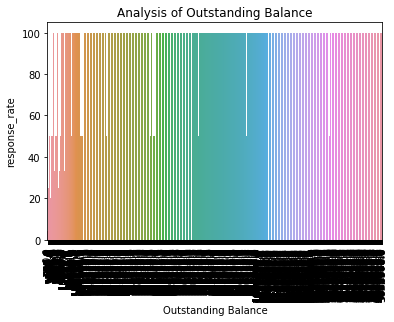

In [74]:
analize('Outstanding Balance','Performance Tag')

In [75]:
curr = cred_master[[ 'Age',  'No of dependents', 'Income', 'No of months in current residence', 'No of months in current company', 'No of times 90 DPD or worse in last 6 months', 'No of times 60 DPD or worse in last 6 months', 'No of times 30 DPD or worse in last 6 months', 'No of times 90 DPD or worse in last 12 months', 'No of times 60 DPD or worse in last 12 months', 'No of times 30 DPD or worse in last 12 months', 'Avgas CC Utilization in last 12 months', 'No of trades opened in last 6 months', 'No of trades opened in last 12 months', 'No of PL trades opened in last 6 months', 'No of PL trades opened in last 12 months', 'No of Inquiries in last 6 months (excluding home & auto loans)', 'No of Inquiries in last 12 months (excluding home & auto loans)', 'Presence of open home loan', 'Outstanding Balance', 'Total No of Trades', 'Presence of open auto loan', ]]
curr.head()

,Age,No of dependents,Income,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan
0,48.0,2.0,40.0,113,56,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0
1,31.0,4.0,55.0,112,46,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0
2,32.0,2.0,46.0,104,49,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0
3,43.0,1.0,53.0,94,53,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1
4,35.0,5.0,44.0,112,43,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0


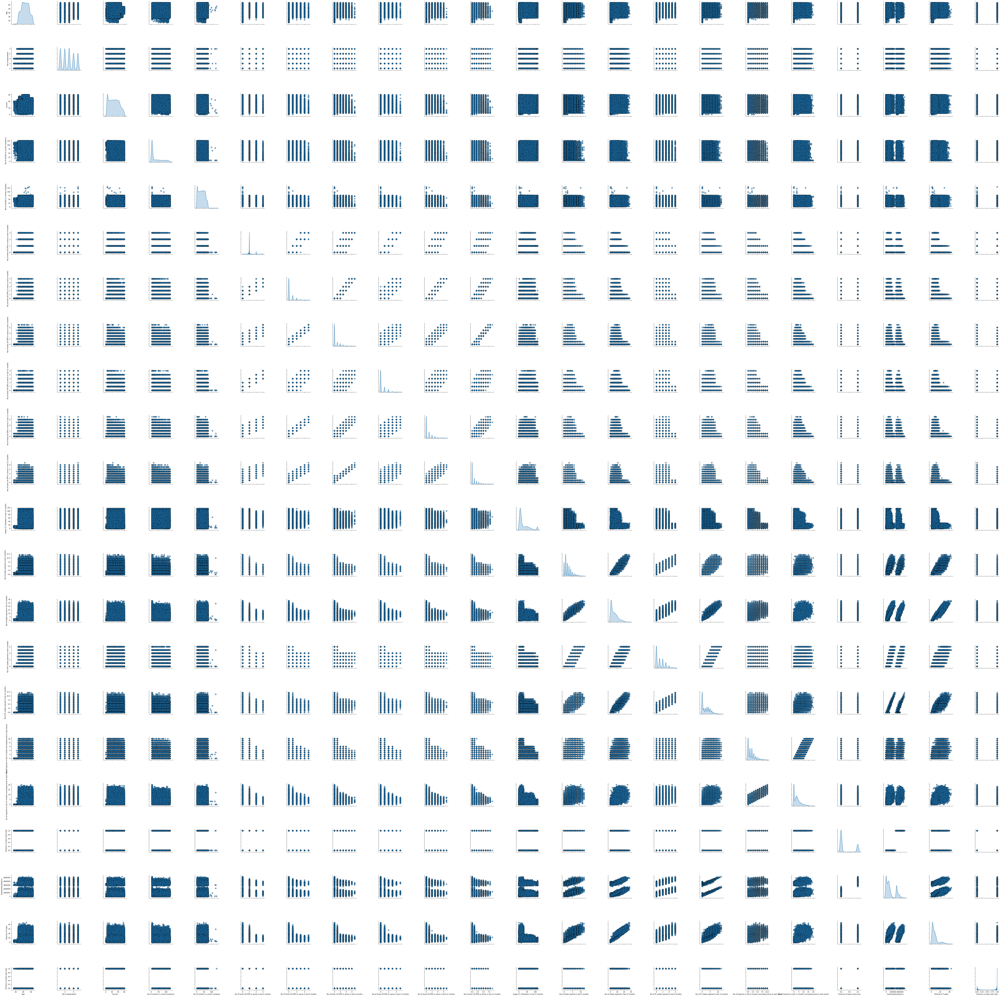

In [76]:
# pairplot
sns.pairplot(curr,  diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4)

In [77]:
cor = curr.corr()
round(cor, 3)

,Age,No of dependents,Income,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan
Age,1.000,0.166,0.059,-0.068,-0.025,-0.017,-0.020,-0.021,-0.021,-0.020,-0.022,-0.005,0.017,0.017,0.013,0.012,0.013,0.017,-0.010,-0.007,0.022,-0.010
No of dependents,0.166,1.000,0.028,-0.005,-0.006,-0.001,-0.001,-0.002,-0.001,0.001,-0.000,-0.006,-0.004,-0.005,-0.004,-0.006,-0.009,-0.009,0.003,0.000,-0.002,-0.003
Income,0.059,0.028,1.000,-0.092,-0.097,-0.189,-0.204,-0.215,-0.211,-0.195,-0.203,-0.182,-0.141,-0.161,-0.179,-0.196,-0.143,-0.155,0.071,0.005,-0.107,0.033
No of months in current residence,-0.068,-0.005,-0.092,1.000,-0.075,0.150,0.145,0.147,0.162,0.185,0.182,0.265,-0.055,-0.039,0.036,0.040,-0.074,-0.084,0.004,0.024,-0.105,0.011
No of months in current company,-0.025,-0.006,-0.097,-0.075,1.000,-0.103,-0.116,-0.123,-0.117,-0.121,-0.126,-0.043,0.019,0.014,-0.007,-0.009,0.023,0.025,0.013,0.012,0.045,0.003
No of times 90 DPD or worse in last 6 months,-0.017,-0.001,-0.189,0.150,-0.103,1.000,0.887,0.841,0.890,0.818,0.797,0.356,0.142,0.178,0.252,0.279,0.143,0.157,-0.110,-0.017,0.038,-0.026
No of times 60 DPD or worse in last 6 months,-0.020,-0.001,-0.204,0.145,-0.116,0.887,1.000,0.952,0.844,0.925,0.904,0.350,0.157,0.195,0.271,0.301,0.158,0.174,-0.115,-0.017,0.045,-0.028
No of times 30 DPD or worse in last 6 months,-0.021,-0.002,-0.215,0.147,-0.123,0.841,0.952,1.000,0.830,0.901,0.951,0.351,0.167,0.207,0.284,0.316,0.169,0.187,-0.119,-0.016,0.049,-0.029
No of times 90 DPD or worse in last 12 months,-0.021,-0.001,-0.211,0.162,-0.117,0.890,0.844,0.830,1.000,0.807,0.803,0.384,0.160,0.200,0.281,0.312,0.164,0.181,-0.121,-0.018,0.043,-0.031
No of times 60 DPD or worse in last 12 months,-0.020,0.001,-0.195,0.185,-0.121,0.818,0.925,0.901,0.807,1.000,0.900,0.343,0.133,0.170,0.253,0.280,0.133,0.147,-0.106,-0.015,0.015,-0.023


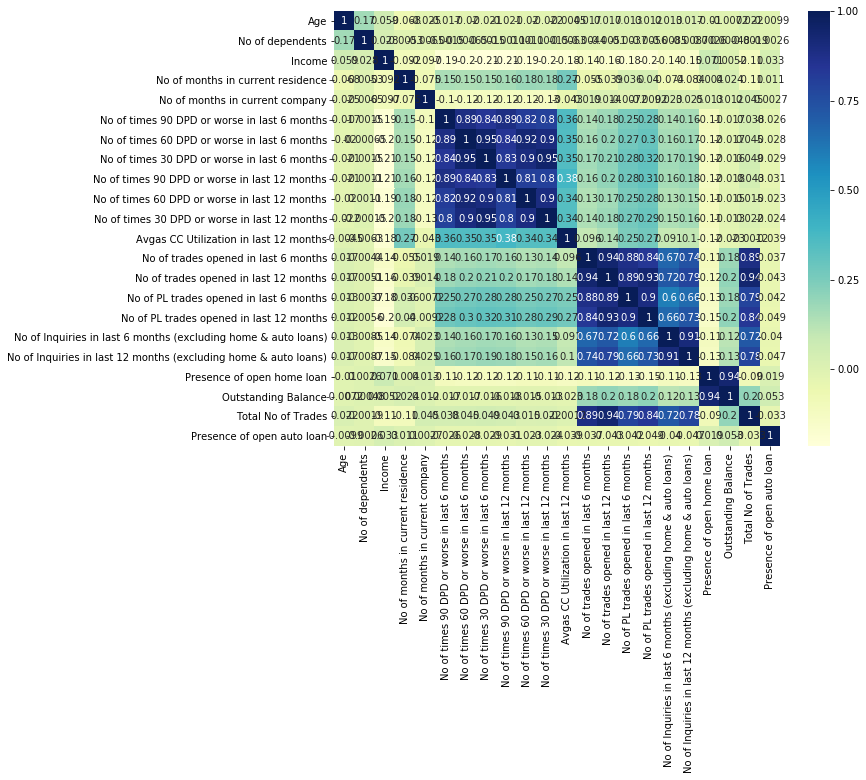

In [78]:
# figure size
plt.figure(figsize=(10,8))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

## Model-building

#### Lets create a helper function to calculate all scores

In [79]:
def all_scores(actual_val,pred_val):
    accuracy = accuracy_score(actual_val,pred_val)
    print('Accuracy Score={0}'.format(accuracy))
    precision_scor = precision_score(actual_val,pred_val)
    print('Precision Score={0}'.format(precision_scor))
    recall_scor = recall_score(actual_val,pred_val)
    print('Recall Score={0}'.format(recall_scor))
    auc_score = roc_auc_score(actual_val,pred_val)
    print('AUC Score={0}'.format(auc_score))
    conf_matrix = confusion_matrix(actual_val,pred_val)
    TN = conf_matrix[0,0]
    FP = conf_matrix[0,1]
    FN = conf_matrix[1,0]
    TP = conf_matrix[1,1]
    print('TN:{0},FP:{1},FN:{2},TP:{3}'.format(TN,FP,FN,TP))
    sensitivity = TP/float(TP+FN)
    speciticity = TN/float(TN+FP)
    fpr = FP/float(FP+TN)
    print('sensitivity:{0},speciticity:{1},fpr:{2}'.format(sensitivity,speciticity,fpr))
    f1_scor = f1_score(actual_val,pred_val)
    print('F1 Score:{0}'.format(f1_scor))
    logloss = log_loss(actual_val,pred_val)
    print('log loss:{0}'.format(logloss))
    classification_repor = classification_report(actual_val,pred_val)
    print(classification_repor)
    
    
# Crete a roc cureve
def create_roc_curve(actual_val,pred_val):
    fpr,tpr,thresholds = roc_curve(actual_val,pred_val)
    plt.plot(fpr,tpr)    
    plt.title('Receiver Operating Characteristic')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

#### Lets start with Demographic data model

In [80]:
# Creating a copy of actual data
demographics_mod = demographics

In [81]:
# Checking the top few records
demographics_mod.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
0,954457215,48,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0.0
1,432830445,31,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0.0
2,941387308,32,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0.0
3,392161677,43,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0.0
4,182011211,35,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0.0


In [82]:
# Removing the data where target is 'NA'
demographics_mod = demographics_mod[~demographics_mod['Performance Tag'].isnull()]

In [83]:
# Checking for the null values
demographics_mod.isnull().sum()

Application ID                                   0
Age                                              0
Gender                                           2
Marital Status (at the time of application)      6
No of dependents                                 3
Income                                           0
Education                                      118
Profession                                      13
Type of residence                                8
No of months in current residence                0
No of months in current company                  0
Performance Tag                                  0
dtype: int64

In [84]:
# Imputing the data
demographics_mod.loc[demographics_mod.Gender.isnull(),'Gender']='M'
demographics_mod.loc[demographics_mod['Marital Status (at the time of application)'].isnull(),'Marital Status (at the time of application)']='Married'
demographics_mod.loc[demographics_mod['No of dependents'].isnull(),'No of dependents']=3.0
demographics_mod.loc[demographics_mod.Education.isnull(),'Education']='Professional'
demographics_mod.loc[demographics_mod['Profession '].isnull(),'Profession ']='SAL'
demographics_mod.loc[demographics_mod['Type of residence'].isnull(),'Type of residence']='Rented'

In [85]:
# Label Encoding the feature having binary hierarchy
demographics_mod['Gender'] = demographics_mod.Gender.map({'M':1,'F':0})
demographics_mod['Marital Status (at the time of application)'] = demographics_mod['Marital Status (at the time of application)'].map({'Married':1,'Single':0})
# Performing one hot encoding on the nominal variables
demographics_mod_dumm = pd.get_dummies(demographics_mod[['Education','Profession ','Type of residence']],drop_first=True)

In [86]:
# Concating the dataframe
demographics_mod = pd.concat([demographics_mod,demographics_mod_dumm],axis='columns')
demographics_mod = demographics_mod.drop(['Education','Profession ','Type of residence','Application ID'],axis='columns')

In [87]:
demographics_y = demographics_mod.pop('Performance Tag')
demographics_X = demographics_mod

In [88]:
demographics_X.loc[demographics_X.Income<0,'Income']=np.quantile(demographics_X.Income,0.25)
demographics_X.loc[demographics_X.Age<=0,'Age']=np.quantile(demographics_X.Age,0.25)

#### Dividing into train and test

In [89]:
X_train,X_test,y_train,y_test = train_test_split(demographics_X,demographics_y,train_size=0.7,random_state=1001)

#### lets Fix the class imbalence

In [90]:
cols = list(X_train.columns)
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_train,y_train = sm.fit_resample(X_train,y_train)
X_train = pd.DataFrame(X_train)
X_train.columns = cols

In [91]:
# Lets scale the data
cols = list(X_train.columns)
scale = StandardScaler()
X_train[cols] = scale.fit_transform(X_train[cols])
X_test[cols] = scale.transform(X_test[cols])

In [92]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(class_weight='balanced')
lr.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [93]:
pred_test = lr.predict(X_test)

In [94]:
all_scores(y_test,pred_test)

Accuracy Score=0.5432946901388293
Precision Score=0.04576253518190347
Recall Score=0.5116550116550117
AUC Score=0.5281500447520445
TN:10949,FP:9154,FN:419,TP:439
sensitivity:0.5116550116550117,speciticity:0.5446450778490772,fpr:0.45535492215092277
F1 Score:0.0840110994163238
log loss:15.774391772499213
              precision    recall  f1-score   support

         0.0       0.96      0.54      0.70     20103
         1.0       0.05      0.51      0.08       858

    accuracy                           0.54     20961
   macro avg       0.50      0.53      0.39     20961
weighted avg       0.93      0.54      0.67     20961



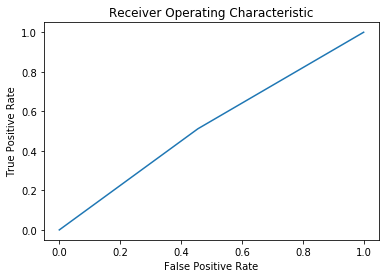

In [95]:
create_roc_curve(y_test,pred_test)

#### We can notice that it is more likely a random model

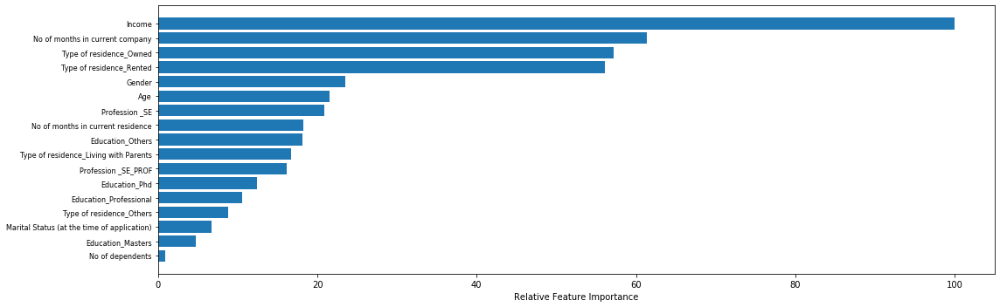

In [96]:
feature_importance = abs(lr.coef_[0])
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
featfig = plt.figure(figsize=(16,5))
featax = featfig.add_subplot(1, 1, 1)
featax.barh(pos, feature_importance[sorted_idx], align='center')
featax.set_yticks(pos)
featax.set_yticklabels(np.array(X_train.columns)[sorted_idx], fontsize=8)
featax.set_xlabel('Relative Feature Importance')
plt.tight_layout()   
plt.show()

#### Above graph we can identify the importaint features

#### Below is the basic RandomForestClassifier that will increase the accuracy

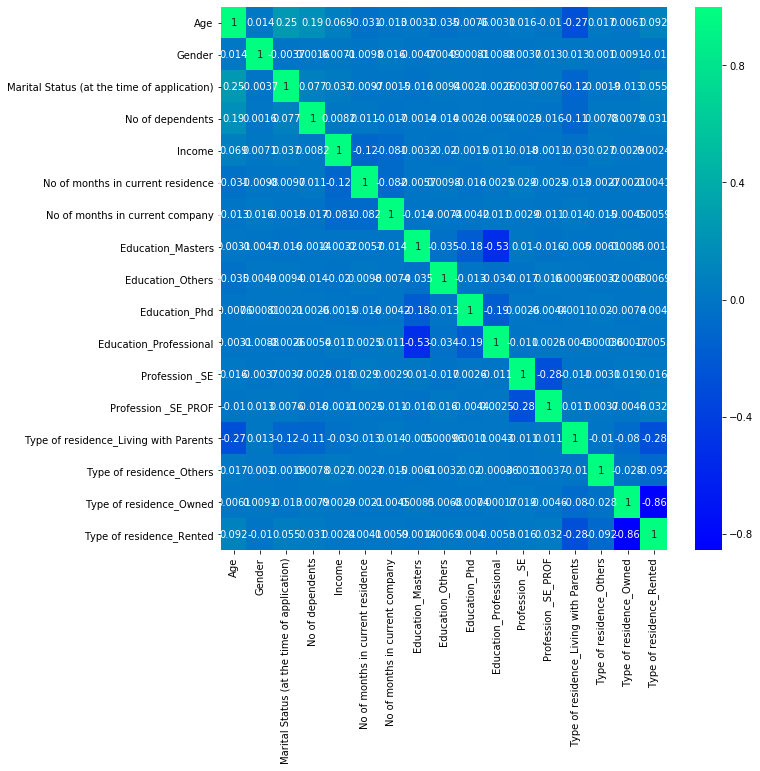

In [97]:
# Before creating a model lets create a heatmap and understand the mulicoleanirity
plt.figure(figsize=(10,10))
sns.heatmap(X_train.corr(),cmap='winter',annot=True)
plt.show()

#### We can see that attributes are negatively correlated in some of the cases,but strong correlation is not present between the features

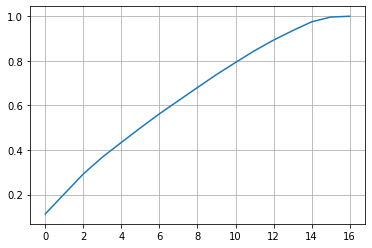

In [98]:
# Lets go for PCA before passing it to other model
from sklearn.decomposition import PCA,IncrementalPCA
pca = PCA(random_state=101)
pca.fit(X_train,y_train)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.grid()
plt.show()
# We can see 10 components are ok
ipca = IncrementalPCA(n_components=12)
X_train_pca = ipca.fit_transform(X_train)

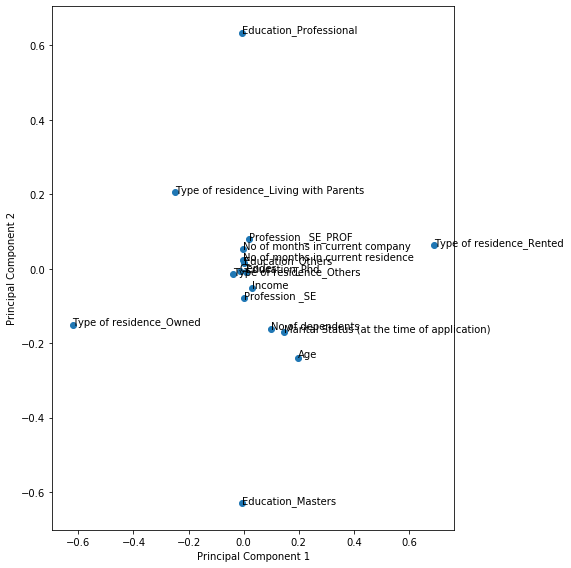

In [99]:
components = pd.DataFrame({'PC1':ipca.components_[0],'PC2':ipca.components_[1],'Feature':X_train.columns })
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(components.PC1, components.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(components.Feature):
    plt.annotate(txt, (components.PC1[i],components.PC2[i]))
plt.tight_layout()
plt.show()

In [100]:
from sklearn.ensemble import RandomForestClassifier

fore = RandomForestClassifier()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=101)
cross_val_score(fore,X_train_pca,y_train,scoring='accuracy',cv=cv,verbose=1)
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200], 
    'max_features': [5, 10,15]
}
demo_rand_search = RandomizedSearchCV(estimator = fore, param_distributions = param_grid, 
                          cv = cv, n_jobs = -1,verbose = 1)
demo_rand_search.fit(X_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   16.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  7.9min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=101, shuffle=True),
                   error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_...
                                                    oob_score=False,
     

In [101]:
print(demo_rand_search.best_score_)
print(demo_rand_search.best_params_)

0.9466135543262351
{'n_estimators': 100, 'min_samples_split': 200, 'min_samples_leaf': 100, 'max_features': 5, 'max_depth': 8}


Accuracy Score=0.740947473880063
Precision Score=0.044802867383512544
Recall Score=0.26223776223776224
AUC Score=0.5118083304548011
TN:15306,FP:4797,FN:633,TP:225
sensitivity:0.26223776223776224,speciticity:0.76137889867184,fpr:0.23862110132815997
F1 Score:0.07653061224489797
log loss:8.947540264931904
              precision    recall  f1-score   support

         0.0       0.96      0.76      0.85     20103
         1.0       0.04      0.26      0.08       858

    accuracy                           0.74     20961
   macro avg       0.50      0.51      0.46     20961
weighted avg       0.92      0.74      0.82     20961



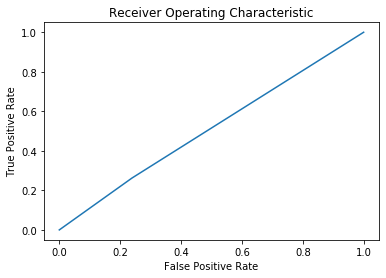

In [102]:
adc = RandomForestClassifier(n_estimators=200, min_samples_split=400, min_samples_leaf=100,
                             max_features=5,max_depth=2,random_state=101)
adc.fit(X_train_pca,y_train)
X_test_pca = ipca.transform(X_test)
pred_abc = adc.predict(X_test_pca)
all_scores(y_test,pred_abc)
create_roc_curve(y_test,pred_abc)

#### We already know that only demographics data is having very low predective power final result

In [103]:

from IPython.display import HTML, display
import tabulate
table = [["Accuracy Score=0.",0.49339249081627784],
         ["sensitivity",0.5291375291375291],
         ["speciticity",0.4918668855394717]]
display(HTML(tabulate.tabulate(table, tablefmt='html')))

Accuracy Score=0.,0.493392
sensitivity,0.529138
speciticity,0.491867


#### Lets Create a model on variable where IV is high

#### As per our IV output the value for below variable is high so lets create a model on this columns
['Avgas CC Utilization in last 12 months' ,'No of trades opened in last 12 months' ,'No of Inquiries in last 12 months (excluding home & auto loans)' ,'Total No of Trades' ,'No of times 30 DPD or worse in last 12 months' ,'No of PL trades opened in last 12 months' ,'No of times 30 DPD or worse in last 6 months' ,'No of times 60 DPD or worse in last 12 months' ,'No of PL trades opened in last 6 months' ,'No of times 90 DPD or worse in last 12 months' ,'No of trades opened in last 6 months' ,'No of Inquiries in last 6 months (excluding home & auto loans)' ,'No of times 60 DPD or worse in last 6 months']

In [104]:
cred_master_high_iv = cred_master[['Avgas CC Utilization in last 12 months' ,'No of trades opened in last 12 months' ,
                                   'No of Inquiries in last 12 months (excluding home & auto loans)' ,
                                   'Total No of Trades' ,'No of times 30 DPD or worse in last 12 months' ,
                                   'No of PL trades opened in last 12 months' ,
                                   'No of times 30 DPD or worse in last 6 months' ,
                                   'No of times 60 DPD or worse in last 12 months' ,
                                   'No of PL trades opened in last 6 months' ,
                                   'Performance Tag']]

In [105]:
cred_master_high_iv.describe()

,Avgas CC Utilization in last 12 months,No of trades opened in last 12 months,No of Inquiries in last 12 months (excluding home & auto loans),Total No of Trades,No of times 30 DPD or worse in last 12 months,No of PL trades opened in last 12 months,No of times 30 DPD or worse in last 6 months,No of times 60 DPD or worse in last 12 months,No of PL trades opened in last 6 months,Performance Tag
count,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000
mean,29.054706,5.785111,3.525063,8.174954,0.733854,2.363492,0.523474,0.603372,1.189626,0.042182
std,29.347448,5.095480,3.611805,7.153028,1.243158,2.423678,1.000733,1.021752,1.352704,0.201006
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,2.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,15.000000,4.000000,3.000000,6.000000,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000
75%,44.000000,9.000000,5.000000,10.000000,1.000000,4.000000,1.000000,1.000000,2.000000,0.000000
max,113.000000,28.000000,20.000000,44.000000,9.000000,12.000000,7.000000,7.000000,6.000000,1.000000


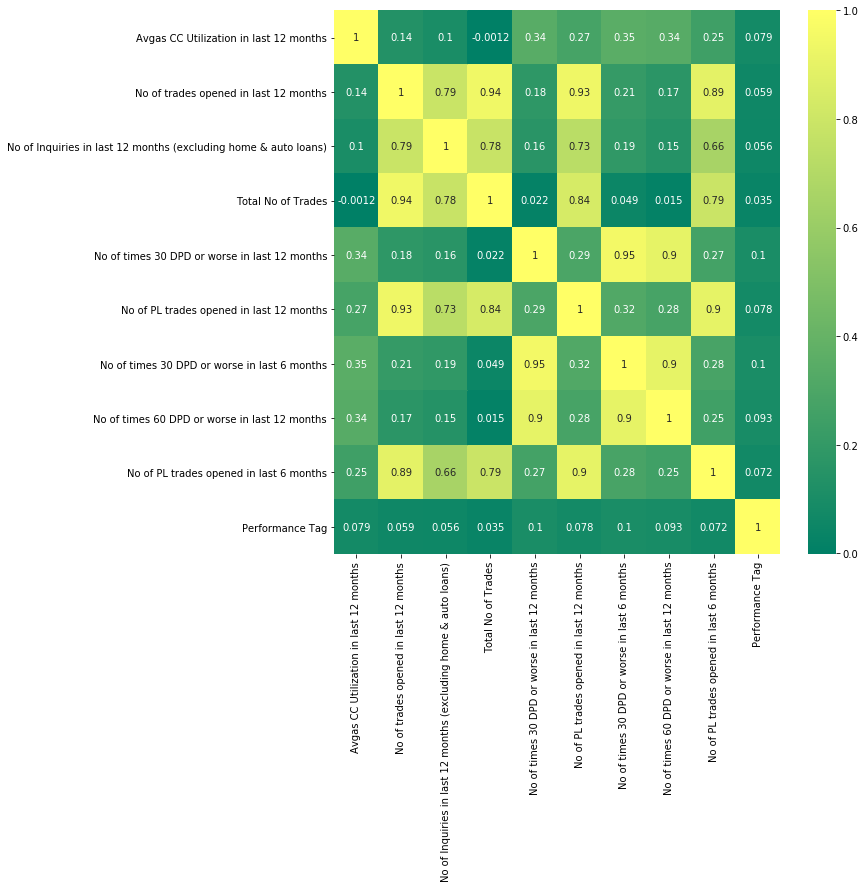

In [106]:
# Lets check multicoleanirity using heatmap
plt.figure(figsize=(10,10))
sns.heatmap(cred_master_high_iv.corr(),annot=True,cmap='summer')
plt.show()

In [107]:
# Lets check for nulls
cred_master_high_iv.isnull().sum()[cred_master_high_iv.isnull().sum()>0]

# Lets split the data
y_high_iv = cred_master_high_iv.pop('Performance Tag')
X_high_iv = cred_master_high_iv

# Lets do a train_test_split

X_train,X_test,y_train,y_test = train_test_split(X_high_iv,y_high_iv,test_size=0.3,random_state=1001)

# Lets Scale the data
iv_cols = list(X_train.columns)
scale = StandardScaler()
X_train[iv_cols] = scale.fit_transform(X_train[iv_cols])
X_test[iv_cols] = scale.transform(X_test[iv_cols])

# Lets handle the class imbalence

sm= SMOTE()
X_train,y_train = sm.fit_resample(X_train,y_train)
X_train = pd.DataFrame(X_train)
X_train.columns = iv_cols

In [108]:
# We can see that some of the features are having high multicoleanirity
# Lets do a PCA to solve the issue , As dropping feature is not a good idea

# iv_pca = PCA(random_state=201)
# iv_pca.fit(X_train)
# plt.plot(np.cumsum(iv_pca.explained_variance_ratio_))
# plt.grid()
# plt.show()

In [109]:
# We can see that 4 components are showing almost more then 90% variance
# iv_ipca = IncrementalPCA(n_components=4)
# X_train_iv_ipca = iv_ipca.fit_transform(X_train)
# X_test = iv_ipca.transform(X_test)

Accuracy Score=0.6072041984732824
Precision Score=0.06999176567462652
Recall Score=0.6453362255965293
AUC Score=0.6253929356348751
TN:12132,FP:7906,FN:327,TP:595
sensitivity:0.6453362255965293,speciticity:0.6054496456732209,fpr:0.3945503543267791
F1 Score:0.12628674519792
log loss:13.566987961669023
              precision    recall  f1-score   support

         0.0       0.97      0.61      0.75     20038
         1.0       0.07      0.65      0.13       922

    accuracy                           0.61     20960
   macro avg       0.52      0.63      0.44     20960
weighted avg       0.93      0.61      0.72     20960



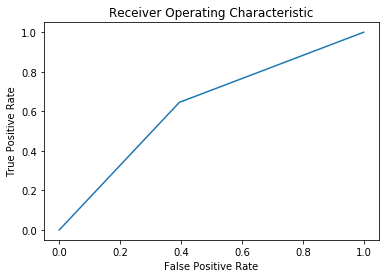

In [110]:
lr = LogisticRegression(class_weight='balanced')
lr.fit(X_train,y_train)
iv_pred = lr.predict(X_test)

all_scores(y_test,iv_pred)

create_roc_curve(y_test,iv_pred)

In [111]:
# Lets try cross validation
fore = RandomForestClassifier()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=2001)
print(cross_val_score(fore,X_train,y_train,scoring='accuracy',cv=cv,verbose=1))
# Lets check RandomForestClassifier(Bagging technique)
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [2, 4]
}
iv_rand_search = RandomizedSearchCV(estimator = fore, param_distributions = param_grid, 
                          cv = cv, n_jobs = -1,verbose = 1)
iv_rand_search.fit(X_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    6.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


[0.9556314  0.95285836 0.95152517 0.95125853 0.95509333]
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  6.4min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=2001, shuffle=True),
                   error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight...
                                                    oob_score=False,
     

{'n_estimators': 100, 'min_samples_split': 200, 'min_samples_leaf': 100, 'max_features': 4, 'max_depth': 10}
0.8009023230017706
Accuracy Score=0.5919847328244274
Precision Score=0.067754362111942
Recall Score=0.648590021691974
AUC Score=0.6189850996772077
TN:11810,FP:8228,FN:324,TP:598
sensitivity:0.648590021691974,speciticity:0.5893801776624413,fpr:0.4106198223375586
F1 Score:0.12269183422240461
log loss:14.092661966456673
              precision    recall  f1-score   support

         0.0       0.97      0.59      0.73     20038
         1.0       0.07      0.65      0.12       922

    accuracy                           0.59     20960
   macro avg       0.52      0.62      0.43     20960
weighted avg       0.93      0.59      0.71     20960



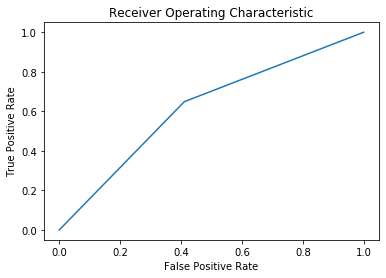

In [112]:
print(iv_rand_search.best_params_)
print(iv_rand_search.best_score_)
final_iv_rforest  = RandomForestClassifier(n_estimators=1000,min_samples_split=200,
                                          min_samples_leaf=100,max_features=4,max_depth=4)
final_iv_rforest.fit(X_train,y_train)
final_iv_rforest_pred = final_iv_rforest.predict(X_test)
all_scores(y_test,final_iv_rforest_pred)
create_roc_curve(y_test,final_iv_rforest_pred)

In [113]:
# Lets try XGBoost
from xgboost.sklearn import XGBClassifier
xgb = XGBClassifier()
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }
rcv = RandomizedSearchCV(estimator=xgb,param_distributions=params,scoring='accuracy',n_jobs=-1,
                        cv=5, verbose=1,random_state=42)
rcv.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.7min finished


RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_alpha=0,
                                           reg_lambda=1, scale_pos_weight=1,
                                           seed=None, silent=None, subsample=1,
                                           verbosity=1),
          

0.9343949316325006
{'subsample': 0.8, 'min_child_weight': 5, 'max_depth': 5, 'gamma': 5, 'colsample_bytree': 0.8}
Accuracy Score=0.8579675572519084
Precision Score=0.08451273756570966
Recall Score=0.22668112798264642
AUC Score=0.5568479000528064
TN:17774,FP:2264,FN:713,TP:209
sensitivity:0.22668112798264642,speciticity:0.8870146721229664,fpr:0.11298532787703364
F1 Score:0.1231222385861561
log loss:4.905713149629345
              precision    recall  f1-score   support

         0.0       0.96      0.89      0.92     20038
         1.0       0.08      0.23      0.12       922

    accuracy                           0.86     20960
   macro avg       0.52      0.56      0.52     20960
weighted avg       0.92      0.86      0.89     20960



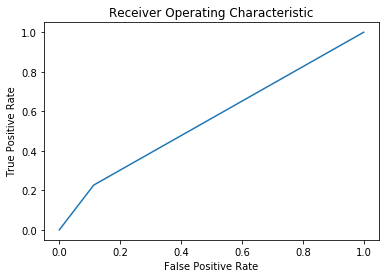

In [114]:
print(rcv.best_score_)
print(rcv.best_params_)
xgb_f = XGBClassifier(subsample=0.8,min_child_weight=5,max_depth=2,colsample_bytree=0.8)
xgb_f.fit(X_train,y_train)
xgb_f_pred = xgb_f.predict(X_test)
all_scores(y_test,xgb_f_pred)
create_roc_curve(y_test,xgb_f_pred)

In [115]:
y_train.shape

(93758,)

In [116]:
# Lets fit a ANN
print(X_train.shape)
y_train = keras.utils.to_categorical(y_train)

model = Sequential()
model.add(Dense(21,input_dim=X_train.shape[1],activation='relu',kernel_initializer='normal'))
model.add(Dense(16,activation='relu',kernel_initializer='normal'))
model.add(Dropout(0.20))
model.add(Dense(8,activation='relu',kernel_initializer='normal'))
model.add(Dense(8,activation='relu',kernel_initializer='normal'))
model.add(Dropout(0.20))
model.add(Dense(2,activation='sigmoid',kernel_initializer='normal'))

model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
print(model.summary())

model.fit(X_train,y_train,batch_size=32,epochs=32,shuffle=True,verbose=1,validation_split=0.2)

(93758, 9)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 21)                210       
_________________________________________________________________
dense_1 (Dense)              (None, 16)                352       
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 72        
_________________________________________________________________
dropout_1 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_4 (Dense)              (None, 2)       

W1219 07:49:28.057181  2424 deprecation.py:323] From C:\Users\Admin\Anaconda3\lib\site-packages\tensorflow-2.0.0b1-py3.7-win-amd64.egg\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 75006 samples, validate on 18752 samples
Epoch 1/32
75006/75006 [==============================] - 16s 218us/sample - loss: 0.6210 - accuracy: 0.6394 - val_loss: 0.9173 - val_accuracy: 0.4161
Epoch 2/32
75006/75006 [==============================] - 5s 68us/sample - loss: 0.6130 - accuracy: 0.6562 - val_loss: 0.9021 - val_accuracy: 0.4477
Epoch 3/32
75006/75006 [==============================] - 5s 68us/sample - loss: 0.6095 - accuracy: 0.6631 - val_loss: 0.8595 - val_accuracy: 0.5390
Epoch 4/32
75006/75006 [==============================] - 5s 68us/sample - loss: 0.6066 - accuracy: 0.6682 - val_loss: 0.8438 - val_accuracy: 0.5457
Epoch 5/32
75006/75006 [==============================] - 5s 70us/sample - loss: 0.6045 - accuracy: 0.6709 - val_loss: 0.8472 - val_accuracy: 0.5180
Epoch 6/32
75006/75006 [==============================] - 5s 68us/sample - loss: 0.6019 - accuracy: 0.6754 - val_loss: 0.8576 - val_accuracy: 0.5204
Epoch 7/32
75006/75006 [==============================

Accuracy Score=0.7326812977099236
Precision Score=0.0706292423408549
Recall Score=0.4175704989154013
AUC Score=0.5823754281182457
TN:14972,FP:5066,FN:537,TP:385
sensitivity:0.4175704989154013,speciticity:0.7471803573210899,fpr:0.25281964267891005
F1 Score:0.12082221873528952
log loss:9.233054146052766
              precision    recall  f1-score   support

         0.0       0.97      0.75      0.84     20038
         1.0       0.07      0.42      0.12       922

    accuracy                           0.73     20960
   macro avg       0.52      0.58      0.48     20960
weighted avg       0.93      0.73      0.81     20960



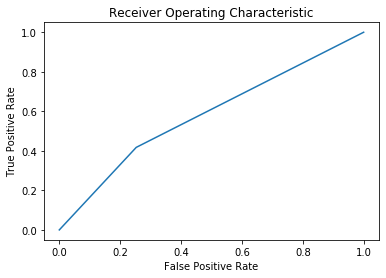

In [117]:
y_test_pred = model.predict(X_test)
y_classes = [np.argmax(y, axis=None, out=None) for y in y_test_pred]
all_scores(y_test,y_classes)
create_roc_curve(y_test,y_classes)

#### We can see in this scenerio RandomForest is doing a good job

In [118]:
from IPython.display import HTML, display
import tabulate
table = [["Accuracy Score=0.",0.5558206106870229],
         ["sensitivity",0.6811279826464208],
         ["speciticity",0.5500548956981735]]
display(HTML(tabulate.tabulate(table, tablefmt='html')))

Accuracy Score=0.,0.555821
sensitivity,0.681128
speciticity,0.550055


#### We can see that the random forest is giving the best score 

#### Now lets create model with full data without the WOE replaced values

In [119]:
# Model with actual data
cred_master.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,954457215,48.0,F,Married,2.0,40.0,Bachelor,SAL,Rented,113,56,0,0,0,0,0,0,4.0,1.0,2,0,0,0,0,1.0,2999395.0,4,0,0.0
1,432830445,31.0,M,Married,4.0,55.0,Professional,SE_PROF,Rented,112,46,0,0,0,0,0,0,3.0,1.0,2,0,0,0,0,0.0,3078.0,5,0,0.0
2,941387308,32.0,M,Single,2.0,46.0,Bachelor,SE_PROF,Rented,104,49,0,0,0,0,0,0,7.0,0.0,0,0,0,0,0,1.0,3004972.0,2,0,0.0
3,392161677,43.0,M,Married,1.0,53.0,Bachelor,SE,Rented,94,53,0,0,0,0,0,0,11.0,1.0,1,0,0,0,0,1.0,3355373.0,4,1,0.0
4,182011211,35.0,F,Married,5.0,44.0,Professional,SAL,Rented,112,43,0,0,0,0,0,0,12.0,0.0,1,0,0,0,0,1.0,3014283.0,4,0,0.0


Accuracy Score=0.607824427480916
Precision Score=0.06754685842272781
Recall Score=0.6489241223103058
AUC Score=0.6274704787474227
TN:12167,FP:7910,FN:310,TP:573
sensitivity:0.6489241223103058,speciticity:0.6060168351845395,fpr:0.3939831648154605
F1 Score:0.12235746316463807
log loss:13.54556616325566
              precision    recall  f1-score   support

         0.0       0.98      0.61      0.75     20077
         1.0       0.07      0.65      0.12       883

    accuracy                           0.61     20960
   macro avg       0.52      0.63      0.43     20960
weighted avg       0.94      0.61      0.72     20960



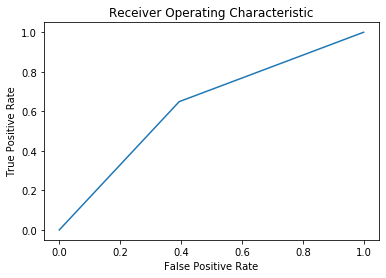

In [120]:
# Creating Dummies
cred_master_dumm = pd.get_dummies(cred_master[['Education','Profession','Type of residence','Gender',
                            'Marital Status (at the time of application)']],drop_first=True)
cred_master = pd.concat([cred_master,cred_master_dumm],axis='columns')
cred_master = cred_master.drop(['Application ID','Education','Profession','Type of residence','Gender',
                                'Marital Status (at the time of application)'],axis='columns')

# Separating the dependent and independent variable
cred_master_y = cred_master.pop('Performance Tag')
cred_master_X = cred_master

# Lets split our dataset into train and test
train_X,test_X,train_y,test_y = train_test_split(cred_master_X,cred_master_y,train_size=0.7,random_state=101)

# Let use SMOTE to solve the class imbalence issue
cols = (train_X.columns)
smot = SMOTE(random_state=101)
train_X,train_y = smot.fit_resample(train_X,train_y)
train_X = pd.DataFrame(train_X)
train_X.columns = cols

# Lets scale our data
sdscaler = StandardScaler()
train_X[cols] = sdscaler.fit_transform(train_X[cols])
test_X[cols] = sdscaler.transform(test_X[cols])

base_model = LogisticRegression()
base_model.fit(train_X,train_y)
base_pred = base_model.predict(test_X)
all_scores(test_y,base_pred)
create_roc_curve(test_y,base_pred)

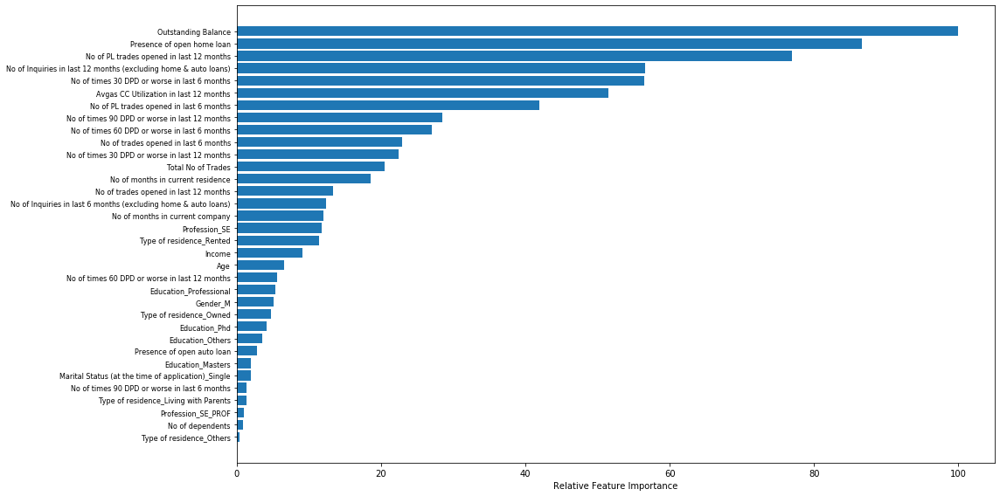

In [121]:
feature_importance = abs(base_model.coef_[0])
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
featfig = plt.figure(figsize=(16,8))
featax = featfig.add_subplot(1, 1, 1)
featax.barh(pos, feature_importance[sorted_idx], align='center')
featax.set_yticks(pos)
featax.set_yticklabels(np.array(train_X.columns)[sorted_idx], fontsize=8)
featax.set_xlabel('Relative Feature Importance')
plt.tight_layout()   
plt.show()

#### Lets create heatmap to check the multicoleniarity

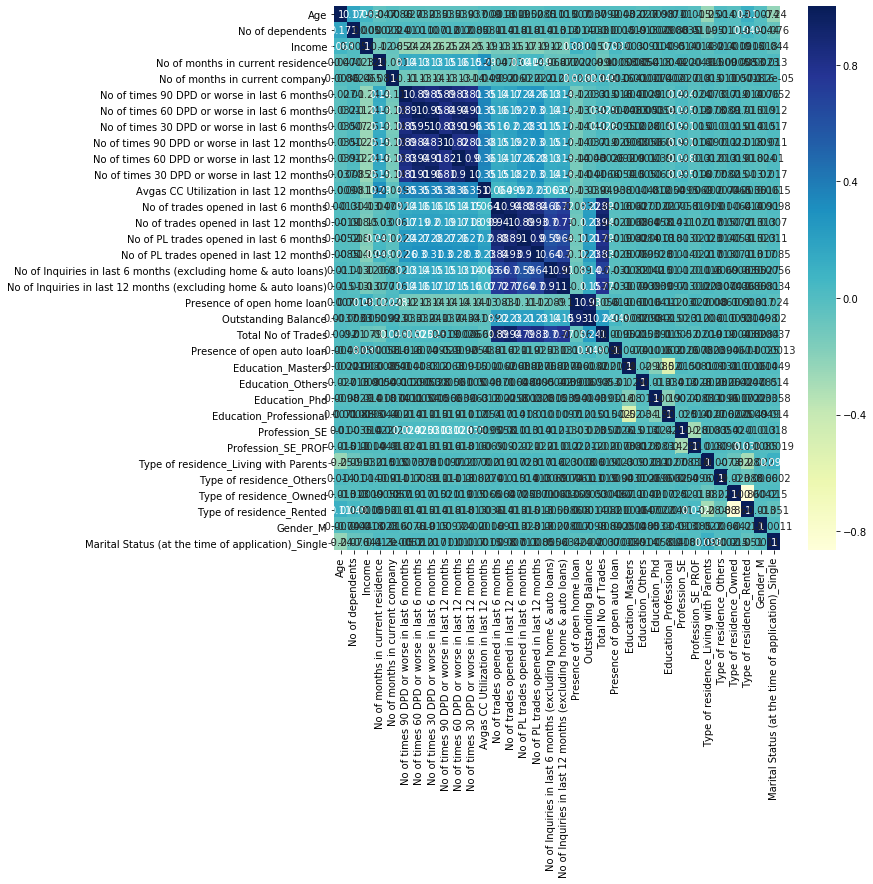

In [122]:
plt.figure(figsize=(10,10))
sns.heatmap(train_X.corr(),annot=True,cmap='YlGnBu')
plt.show()

#### We can see the multicoleanirity is high so its better to do PCA then dropping variables

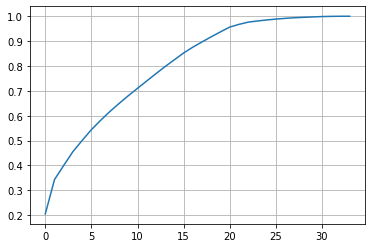

In [123]:
pc = PCA(random_state=1001)
pca.fit(train_X)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.grid()
plt.show()

#### We can see that almost 18 PC,s are explaining more then 85% variance

In [124]:
ipc = IncrementalPCA(n_components=18)
train_X_pc = ipc.fit_transform(train_X)
test_X = ipc.transform(test_X)

Accuracy Score=0.6270992366412214
Precision Score=0.06652494685507065
Recall Score=0.6024915062287656
AUC Score=0.6153365037245337
TN:12612,FP:7465,FN:351,TP:532
sensitivity:0.6024915062287656,speciticity:0.6281815012203018,fpr:0.37181849877969814
F1 Score:0.11981981981981982
log loss:12.8798208634274
              precision    recall  f1-score   support

         0.0       0.97      0.63      0.76     20077
         1.0       0.07      0.60      0.12       883

    accuracy                           0.63     20960
   macro avg       0.52      0.62      0.44     20960
weighted avg       0.93      0.63      0.74     20960



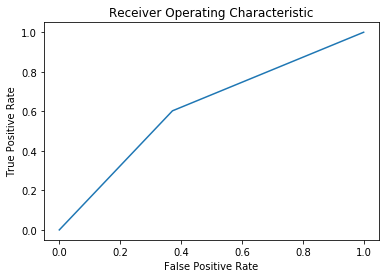

In [125]:
# Lets fit the logistic regression again
base_model = LogisticRegression(class_weight='balanced')
base_model.fit(train_X_pc,train_y)
base_pred = base_model.predict(test_X)
all_scores(test_y,base_pred)
create_roc_curve(test_y,base_pred)

#### We can see that with logistic regression our model has improved lets try with some other models

In [126]:
# Lets check the cross validation scores
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold,cross_val_score
est = DecisionTreeClassifier()
sfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cross_val_score(est,train_X_pc,train_y,verbose=1,scoring='accuracy',cv=sfold)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   14.3s finished


array([0.89837746, 0.89597566, 0.89832408, 0.9000854 , 0.89859095])

In [127]:
# Lets try with Decision tree with cross validation
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}
dtree = DecisionTreeClassifier()

model_cv = RandomizedSearchCV(estimator = dtree, param_distributions = param_grid, 
                          cv = sfold, verbose = 1)
model_cv.fit(train_X_pc,train_y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:  1.5min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   error_score='raise-deprecating',
                   estimator=DecisionTreeClassifier(class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort=False,
                                                    random_stat

In [128]:
print(model_cv.best_score_)
print(model_cv.best_params_)

0.7971925704526046
{'min_samples_split': 50, 'min_samples_leaf': 50, 'max_depth': 10, 'criterion': 'gini'}


Accuracy Score=0.6034351145038168
Precision Score=0.06004974535117849
Recall Score=0.5741789354473387
AUC Score=0.5894503782182651
TN:12141,FP:7936,FN:376,TP:507
sensitivity:0.5741789354473387,speciticity:0.6047218209891916,fpr:0.39527817901080836
F1 Score:0.10872828651082994
log loss:13.697168654566013
              precision    recall  f1-score   support

         0.0       0.97      0.60      0.74     20077
         1.0       0.06      0.57      0.11       883

    accuracy                           0.60     20960
   macro avg       0.52      0.59      0.43     20960
weighted avg       0.93      0.60      0.72     20960



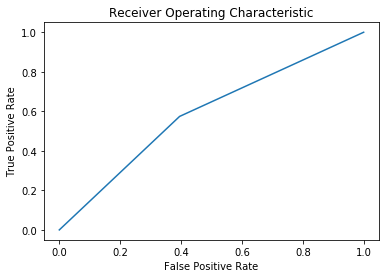

In [129]:
final_dtree = DecisionTreeClassifier(criterion='gini',max_depth=2,min_samples_leaf=50,min_samples_split=50)
final_dtree.fit(train_X_pc,train_y)
dtree_pred = final_dtree.predict(test_X)
all_scores(test_y,dtree_pred)
create_roc_curve(test_y,dtree_pred)

In [130]:
# Lets check RandomForestClassifier(Bagging technique)
from sklearn.ensemble import RandomForestClassifier
stfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1001)
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
rf = RandomForestClassifier()
rand_search = RandomizedSearchCV(estimator = rf, param_distributions = param_grid, 
                          cv = stfold, n_jobs = -1,verbose = 1)
rand_search.fit(train_X_pc,train_y)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 25.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 26.5min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=1001, shuffle=True),
                   error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight...
                                                    oob_score=False,
     

In [131]:
print(rand_search.best_score_)
print(rand_search.best_params_)

0.8203351836037575
{'n_estimators': 200, 'min_samples_split': 200, 'min_samples_leaf': 100, 'max_features': 5, 'max_depth': 10}


Accuracy Score=0.5263358778625954
Precision Score=0.06164582727537075
Recall Score=0.7202718006795017
AUC Score=0.6190391229327677
TN:10396,FP:9681,FN:247,TP:636
sensitivity:0.7202718006795017,speciticity:0.5178064451860338,fpr:0.48219355481396625
F1 Score:0.11357142857142859
log loss:16.360148518673423
              precision    recall  f1-score   support

         0.0       0.98      0.52      0.68     20077
         1.0       0.06      0.72      0.11       883

    accuracy                           0.53     20960
   macro avg       0.52      0.62      0.40     20960
weighted avg       0.94      0.53      0.65     20960



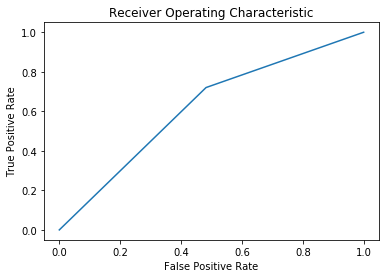

In [132]:
# Manually setting up the max depth
final_rforest = RandomForestClassifier(n_estimators=300,min_samples_split=200,min_samples_leaf=100,
                                      max_features=10,max_depth=2)
final_rforest.fit(train_X_pc,train_y)
rforest_pred = final_rforest.predict(test_X)
all_scores(test_y,rforest_pred)
create_roc_curve(test_y,rforest_pred)

In [133]:
from xgboost.sklearn import XGBClassifier
xgb = XGBClassifier()
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }
rcv = RandomizedSearchCV(estimator=xgb,param_distributions=params,scoring='accuracy',n_jobs=-1,
                        cv=5, verbose=1,random_state=42)
rcv.fit(train_X_pc,train_y)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  7.4min finished


RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_alpha=0,
                                           reg_lambda=1, scale_pos_weight=1,
                                           seed=None, silent=None, subsample=1,
                                           verbosity=1),
          

In [134]:
print(rcv.best_score_)
print(rcv.best_params_)

0.8744235695986337
{'subsample': 0.8, 'min_child_weight': 5, 'max_depth': 5, 'gamma': 5, 'colsample_bytree': 0.8}


Accuracy Score=0.7967557251908397
Precision Score=0.06470739881412735
Recall Score=0.2842582106455266
AUC Score=0.5517769610781051
TN:16449,FP:3628,FN:632,TP:251
sensitivity:0.2842582106455266,speciticity:0.8192957115106839,fpr:0.18070428848931613
F1 Score:0.10541789164216715
log loss:7.019946964780356
              precision    recall  f1-score   support

         0.0       0.96      0.82      0.89     20077
         1.0       0.06      0.28      0.11       883

    accuracy                           0.80     20960
   macro avg       0.51      0.55      0.50     20960
weighted avg       0.93      0.80      0.85     20960



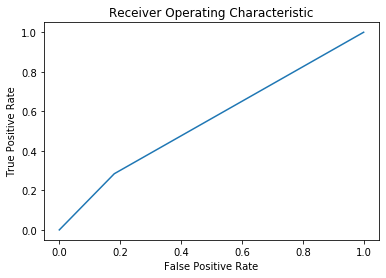

In [135]:
final_xgb = XGBClassifier(subsample=0.8,min_child_weight=5,max_depth=2,gamma=5,colsample_bytree=0.8)
final_xgb.fit(train_X_pc,train_y)
xgb_pred = final_xgb.predict(test_X)
all_scores(test_y,xgb_pred)
create_roc_curve(test_y,xgb_pred)

In [136]:
# Logistic Regression score
from IPython.display import HTML, display
import tabulate
table = [["Accuracy Score=0.",0.6270992366412214],
         ["sensitivity",0.6024915062287656],
         ["speciticity",0.6281815012203018]]
display(HTML(tabulate.tabulate(table, tablefmt='html')))

Accuracy Score=0.,0.627099
sensitivity,0.602492
speciticity,0.628182


###### Till now we have made models on
###### Demographics Data
###### Full Data Without WOE Replaced
###### High IV Values

#### Now lets create model with full data with the WOE replaced values

In [137]:
cred_master_woe.head()

,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
0,-0.007368,0.032129,-0.004102,0.005351,-0.110416,0.017390,-0.028375,-0.004479,0.206757,-0.122937,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.798937,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,-0.236703,0.088272,-0.686175,0.011973,0.0
1,0.031580,-0.010133,-0.004102,-0.010384,-0.251315,-0.017823,-0.013343,-0.004479,0.206757,-0.073182,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.798937,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,0.071794,-0.095262,0.210325,0.011973,0.0
2,0.031580,-0.010133,0.023383,0.005351,-0.251315,0.017390,-0.013343,-0.004479,0.206757,-0.073182,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.798937,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,-0.236703,0.088272,-0.686175,0.011973,0.0
3,-0.007368,-0.010133,-0.004102,0.005351,-0.251315,0.017390,0.091379,-0.004479,0.206757,-0.122937,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.522960,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,-0.236703,0.088272,-0.686175,-0.138237,0.0
4,0.031580,0.032129,-0.004102,-0.010384,-0.251315,-0.017823,-0.028375,-0.004479,0.206757,-0.073182,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.522960,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,-0.236703,0.088272,-0.686175,0.011973,0.0


In [138]:
cred_master_woe.isnull().sum()

Age                                                                0
Gender                                                             0
Marital Status (at the time of application)                        0
No of dependents                                                   0
Income                                                             0
Education                                                          0
Profession                                                         0
Type of residence                                                  0
No of months in current residence                                  0
No of months in current company                                    0
No of times 90 DPD or worse in last 6 months                       0
No of times 60 DPD or worse in last 6 months                       0
No of times 30 DPD or worse in last 6 months                       0
No of times 90 DPD or worse in last 12 months                      0
No of times 60 DPD or worse in las

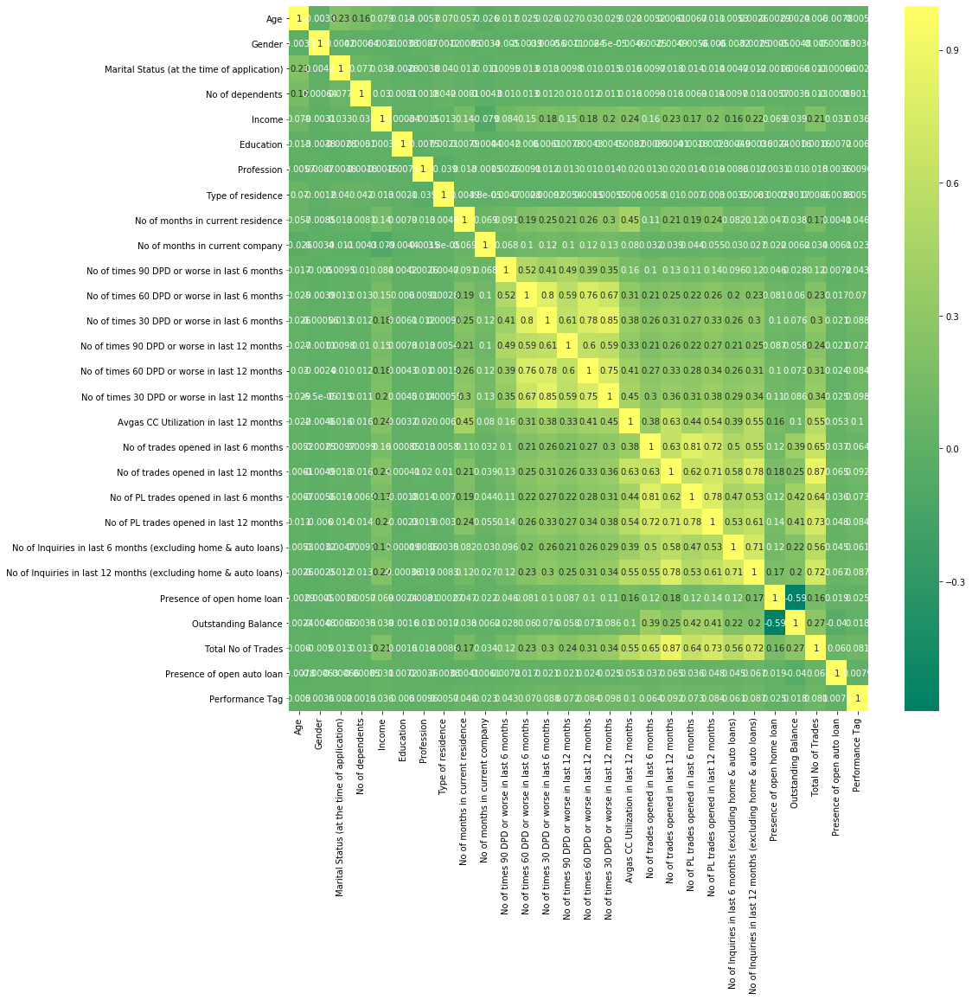

In [139]:
plt.figure(figsize=(15,15))
sns.heatmap(cred_master_woe.corr(),annot=True,cmap='summer')
plt.show()

#### As we are now working with WOE replaced dataset so there is no need for encoding and it also help to deal with the outliers

In [140]:
cred_master_woe.describe()

,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,No of times 90 DPD or worse in last 6 months,No of times 60 DPD or worse in last 6 months,No of times 30 DPD or worse in last 6 months,No of times 90 DPD or worse in last 12 months,No of times 60 DPD or worse in last 12 months,No of times 30 DPD or worse in last 12 months,Avgas CC Utilization in last 12 months,No of trades opened in last 6 months,No of trades opened in last 12 months,No of PL trades opened in last 6 months,No of PL trades opened in last 12 months,No of Inquiries in last 6 months (excluding home & auto loans),No of Inquiries in last 12 months (excluding home & auto loans),Presence of open home loan,Outstanding Balance,Total No of Trades,Presence of open auto loan,Performance Tag
count,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000,69864.000000
mean,-0.000286,-0.000148,-0.000044,-0.000025,-0.014890,-0.000337,-0.001008,-0.000450,-0.024034,-0.005763,-0.012038,-0.036409,-0.060162,-0.039168,-0.057417,-0.079240,-0.137369,-0.042981,-0.129385,-0.056220,-0.081712,-0.042761,-0.114666,-0.008002,-0.003852,-0.093091,-0.000775,0.042182
std,0.024959,0.017953,0.009751,0.007463,0.180092,0.026005,0.046498,0.032916,0.229823,0.111153,0.144993,0.257434,0.333342,0.268135,0.328074,0.387005,0.556764,0.301059,0.563195,0.343595,0.421066,0.304975,0.529394,0.135091,0.091767,0.470073,0.041861,0.201006
min,-0.028151,-0.010133,-0.004102,-0.010384,-0.251315,-0.029557,-0.028375,-0.530587,-0.252890,-0.122937,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.798937,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,-0.236703,-0.095262,-0.686175,-0.138237,0.000000
25%,-0.028151,-0.010133,-0.004102,-0.010384,-0.110416,-0.017823,-0.028375,-0.004479,-0.252890,-0.073182,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.798937,-0.270769,-0.865089,-0.314635,-0.453113,-0.320076,-0.828287,-0.236703,-0.095262,-0.686175,0.011973,0.000000
50%,-0.007368,-0.010133,-0.004102,0.005351,0.046772,0.007904,-0.028375,-0.004479,-0.252890,-0.007203,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,-0.522960,-0.270769,0.228323,-0.314635,-0.453113,-0.320076,0.182735,0.071794,-0.095262,0.210325,0.011973,0.000000
75%,0.031580,-0.010133,-0.004102,0.005351,0.233989,0.007904,-0.013343,-0.004479,0.206757,0.167150,-0.036826,-0.121396,-0.198525,-0.133612,-0.200628,-0.268944,0.358297,0.354912,0.368415,0.400627,0.395652,0.292629,0.368408,0.071794,0.088272,0.332417,0.011973,0.000000
max,0.031580,0.032129,0.023383,0.005351,0.233989,0.492577,0.091379,0.080756,0.206757,0.167150,0.836054,0.743374,0.742906,0.722079,0.694138,0.710255,0.503393,0.354912,0.368415,0.400627,0.395652,0.292629,0.368408,0.071794,0.088272,0.332417,0.011973,1.000000


In [141]:
cred_master_woe_m = cred_master_woe

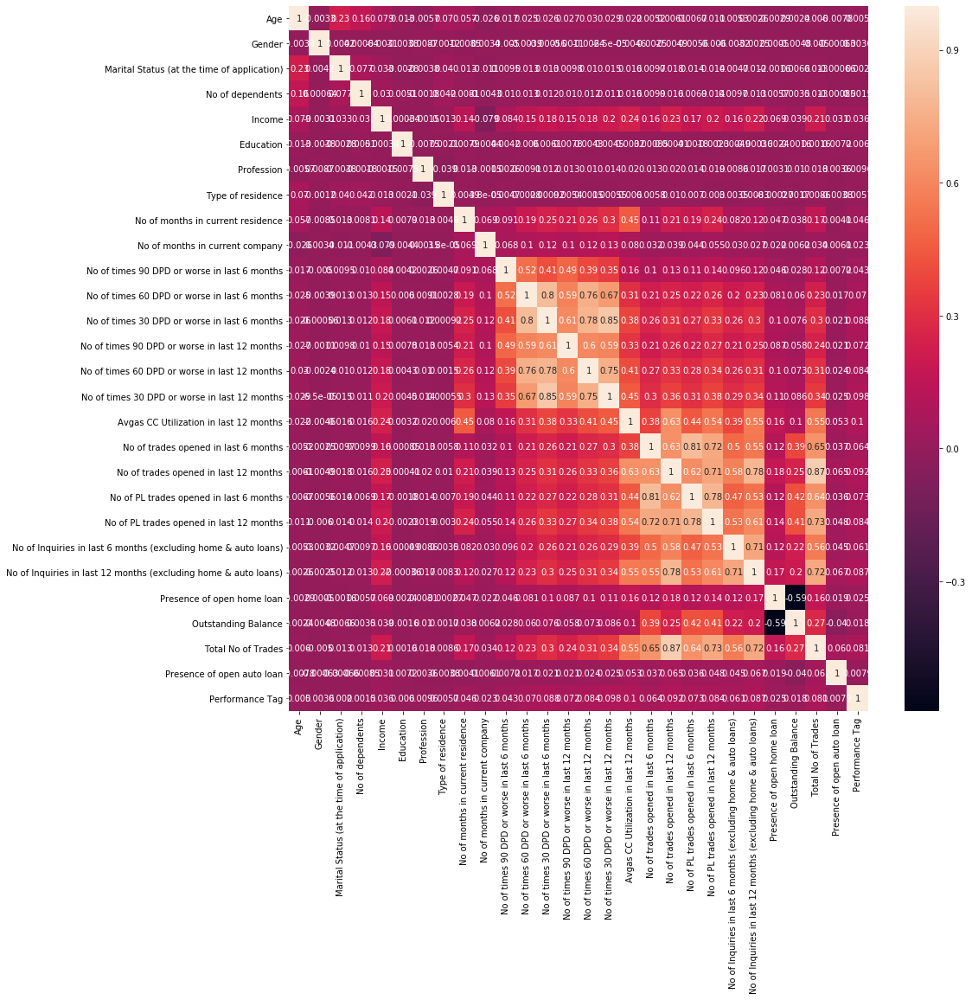

In [142]:
# Lets check with the correlation using heatmap
plt.figure(figsize=(15,15))
sns.heatmap(cred_master_woe.corr(),annot=True)
plt.show()

In [143]:
#### Lets separate the dependent and independet variable
y_woe = cred_master_woe_m.pop('Performance Tag')
X_woe = cred_master_woe_m

In [144]:
# Lets do and train and test split of the data
X_train_woe,X_test_woe,y_train_woe,y_test_woe = train_test_split(X_woe,y_woe,train_size=0.7,test_size=0.3,random_state=999)

In [145]:
print(X_train_woe.shape)
print(X_test_woe.shape)

(48904, 27)
(20960, 27)


In [146]:
# As we know it is a highly imbalence dataset let do a oversampling
sm_woe = SMOTE(random_state=101)
X_train_woe,y_train_woe = sm_woe.fit_resample(X_train_woe,y_train_woe)

Accuracy Score=0.5712786259541984
Precision Score=0.06613869863013698
Recall Score=0.7038724373576309
AUC Score=0.6346769815510394
TN:11356,FP:8726,FN:260,TP:618
sensitivity:0.7038724373576309,speciticity:0.5654815257444478,fpr:0.43451847425555223
F1 Score:0.12091567207982781
log loss:14.807844559725348
              precision    recall  f1-score   support

         0.0       0.98      0.57      0.72     20082
         1.0       0.07      0.70      0.12       878

    accuracy                           0.57     20960
   macro avg       0.52      0.63      0.42     20960
weighted avg       0.94      0.57      0.69     20960



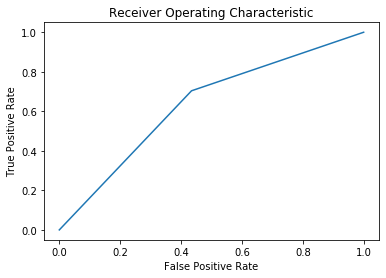

In [147]:
# Lets fit a basic logistic regression model 
lr_woe = LogisticRegression(class_weight='balanced')
lr_woe.fit(X_train_woe,y_train_woe)
lr_woe_ty = lr_woe.predict(X_test_woe)
all_scores(y_test_woe,lr_woe_ty)
create_roc_curve(y_test_woe,lr_woe_ty)

In [148]:
# Lets try PCA and again try with the model
pc_woe  = PCA(random_state=101)
pc_woe.fit(X_train_woe)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=101,
    svd_solver='auto', tol=0.0, whiten=False)

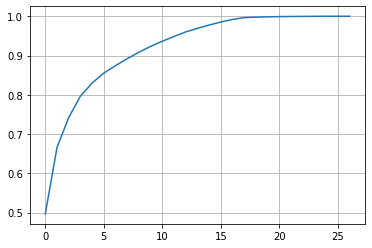

In [149]:
plt.plot(np.cumsum(pc_woe.explained_variance_ratio_))
plt.grid()
plt.show()

#### We can see 5 PC,s are explaining a variance of 85%

In [150]:
woe_ipca = IncrementalPCA(n_components=15)
X_train_woe = woe_ipca.fit_transform(X_train_woe)
X_test_woe = woe_ipca.transform(X_test_woe)

Accuracy Score=0.5695610687022901
Precision Score=0.06588486140724947
Recall Score=0.7038724373576309
AUC Score=0.633780656483815
TN:11320,FP:8762,FN:260,TP:618
sensitivity:0.7038724373576309,speciticity:0.563688875609999,fpr:0.43631112439000097
F1 Score:0.12049132384480406
log loss:14.867168258948835
              precision    recall  f1-score   support

         0.0       0.98      0.56      0.72     20082
         1.0       0.07      0.70      0.12       878

    accuracy                           0.57     20960
   macro avg       0.52      0.63      0.42     20960
weighted avg       0.94      0.57      0.69     20960



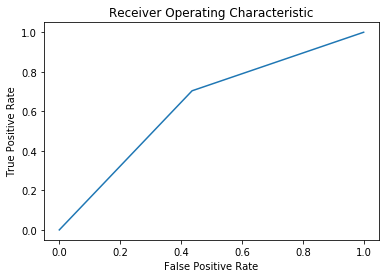

In [151]:
# Lets fit the logistic regression again
lr_woe_n = LogisticRegression(class_weight='balanced')
lr_woe_n.fit(X_train_woe,y_train_woe)
lr_woe_ty = lr_woe_n.predict(X_test_woe)
all_scores(y_test_woe,lr_woe_ty)
create_roc_curve(y_test_woe,lr_woe_ty)

In [152]:
# Lets do a Random Forest Classifier

woe_replaced_rforest = RandomForestClassifier()
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=101)
cross_val_score(fore,X_train_woe,y_train_woe,scoring='accuracy',cv=cv,verbose=1)
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200], 
    'max_features': [5, 10,15]
}
demo_rand_search = RandomizedSearchCV(estimator = woe_replaced_rforest, param_distributions = param_grid, 
                          cv = cv, n_jobs = -1,verbose = 1)
demo_rand_search.fit(X_train_woe,y_train_woe)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 14.3min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=101, shuffle=True),
                   error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_...
                                                    oob_score=False,
     

In [153]:
print(demo_rand_search.best_score_)
print(demo_rand_search.best_params_)

0.6990818832070033
{'n_estimators': 100, 'min_samples_split': 400, 'min_samples_leaf': 100, 'max_features': 5, 'max_depth': 10}


In [154]:
woe_rep_final_f = RandomForestClassifier(n_estimators=600,min_samples_split=200,
                                        min_samples_leaf=100,max_features=5,
                                        max_depth=4)
woe_rep_final_f.fit(X_train_woe,y_train_woe)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=4, max_features=5, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Accuracy Score=0.5581106870229008
Precision Score=0.06568586821384169
Recall Score=0.7220956719817767
AUC Score=0.6365184066511812
TN:11064,FP:9018,FN:244,TP:634
sensitivity:0.7220956719817767,speciticity:0.5509411413205856,fpr:0.4490588586794144
F1 Score:0.12041785375118708
log loss:15.262660197485125
              precision    recall  f1-score   support

         0.0       0.98      0.55      0.70     20082
         1.0       0.07      0.72      0.12       878

    accuracy                           0.56     20960
   macro avg       0.52      0.64      0.41     20960
weighted avg       0.94      0.56      0.68     20960



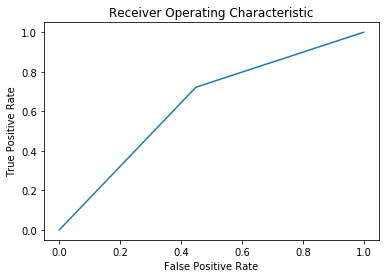

In [155]:
rf_woe_ty = woe_rep_final_f.predict(X_test_woe)
all_scores(y_test_woe,rf_woe_ty)
create_roc_curve(y_test_woe,rf_woe_ty)

##### We have selected Logistic Regression with Incremengtal PCA on the WOE replaced data as our final model and we will be plotting
##### Gain and Lift charts on the same.

In [157]:
# predict
predictions = lr_woe_ty

In [158]:
print(classification_report(y_test_woe,predictions))

              precision    recall  f1-score   support

         0.0       0.98      0.56      0.72     20082
         1.0       0.07      0.70      0.12       878

    accuracy                           0.57     20960
   macro avg       0.52      0.63      0.42     20960
weighted avg       0.94      0.57      0.69     20960



In [160]:
print(confusion_matrix(y_test_woe,predictions))

[[11320  8762]
 [  260   618]]


In [163]:
from sklearn.pipeline import Pipeline


In [164]:
# create pipeline
PCA_VARS = 15
steps = [("pca", IncrementalPCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [165]:
# fit model
pipeline.fit(X_train_woe,y_train_woe)
# check score on train data
pipeline.score(X_train_woe,y_train_woe)

0.6300629870823102

In [167]:
from imblearn.metrics import sensitivity_specificity_support
# predict churn on test data
y_pred = pipeline.predict(X_test_woe)

# create onfusion matrix
cm = confusion_matrix(y_test_woe, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test_woe, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test_woe)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test_woe, y_pred_prob),2))

[[11320  8762]
 [  260   618]]
Sensitivity: 	0.7
Specificity: 	0.56
AUC:    	 0.67


In [174]:
pred_prob = pd.DataFrame(pd.Series(y_pred_prob), columns = ['pred_prob'])

In [175]:
decile_df = pd.concat([pd.DataFrame(y_test_woe).reset_index(), pred_prob], ignore_index=True,axis=1)

In [176]:
decile_df.drop(0, inplace=True, axis = 1)

In [177]:
decile_df.rename({1:'actual', 2:'pred_prob'}, axis=1, inplace=True)

In [178]:
decile_df['predicted'] = decile_df.pred_prob.map( lambda x: 1 if x > 0.5 else 0)

In [179]:
decile_df

,actual,pred_prob,predicted
0,0.0,0.546020,1
1,0.0,0.235370,0
2,1.0,0.681480,1
3,0.0,0.348561,0
4,0.0,0.261292,0
5,0.0,0.682780,1
6,0.0,0.479131,0
7,0.0,0.600115,1
8,0.0,0.258740,0
9,0.0,0.231396,0


In [180]:
decile_df['decile'] = pd.qcut(decile_df['pred_prob'], 10, labels=np.arange(10, 0, -1))

In [181]:
lift_df = decile_df.groupby('decile')['pred_prob'].count().reset_index()

In [182]:
lift_df.rename({'pred_prob':'total'}, axis=1, inplace=True)

In [183]:
lift_df_pred = decile_df[decile_df['actual']==1].groupby('decile')['actual'].count().reset_index()

In [184]:
lift_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 2 columns):
decile    10 non-null category
total     10 non-null int64
dtypes: category(1), int64(1)
memory usage: 570.0 bytes


In [185]:
lift_df_final = lift_df.merge(lift_df_pred,on = 'decile')

In [186]:
lift_df_final = lift_df_final.sort_values(['decile'], ascending=False)

In [187]:
lift_df_final['cumresp'] = lift_df_final['actual'].cumsum()

In [188]:
lift_df_final['gain'] = 100*(lift_df_final['cumresp']/sum(lift_df_final['actual']))

In [189]:
lift_df_final['cumlift'] = lift_df_final['gain']/(lift_df_final['decile'].astype('int')*(100/10))

In [190]:
lift_df_final

,decile,total,actual,cumresp,gain,cumlift
9,1,2096,167,167,19.020501,1.902050
8,2,2096,172,339,38.610478,1.930524
7,3,2096,105,444,50.569476,1.685649
6,4,2096,116,560,63.781321,1.594533
5,5,2096,106,666,75.854214,1.517084
4,6,2096,59,725,82.574032,1.376234
3,7,2096,61,786,89.521640,1.278881
2,8,2096,32,818,93.166287,1.164579
1,9,2096,32,850,96.810934,1.075677
0,10,2096,28,878,100.000000,1.000000


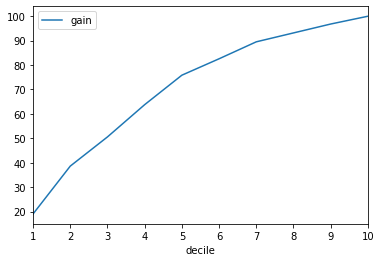

In [191]:
lift_df_final.plot.line(x='decile', y=['gain'])

#### Within first 5 deciles as per the model we are able to predict 75% of defaulters correctly.

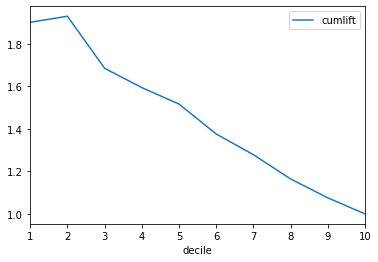

In [192]:
lift_df_final.plot.line(x='decile', y=['cumlift'])

#### A lift of 2 times is achieved with the model within first 2 deciles compared to random mode


## Application Scorecard

In [197]:
decile_df.count()

actual       20960
pred_prob    20960
predicted    20960
decile       20960
dtype: int64

In [199]:
X_woe.count()

Age                                                                69864
Gender                                                             69864
Marital Status (at the time of application)                        69864
No of dependents                                                   69864
Income                                                             69864
Education                                                          69864
Profession                                                         69864
Type of residence                                                  69864
No of months in current residence                                  69864
No of months in current company                                    69864
No of times 90 DPD or worse in last 6 months                       69864
No of times 60 DPD or worse in last 6 months                       69864
No of times 30 DPD or worse in last 6 months                       69864
No of times 90 DPD or worse in last 12 months      

In [202]:
# fit model
pipeline.fit(X_woe,y_woe)
# check score on train data
pipeline.score(X_woe,y_woe)

0.5744303217680065

In [203]:
from imblearn.metrics import sensitivity_specificity_support
# predict churn on test data
y_pred = pipeline.predict(X_woe)

# create onfusion matrix
cm = confusion_matrix(y_woe, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_woe, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_woe)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_woe, y_pred_prob),2))

[[38089 28828]
 [  904  2043]]
Sensitivity: 	0.69
Specificity: 	0.57
AUC:    	 0.67


In [204]:
pred_probablity = pd.DataFrame(pd.Series(y_pred_prob), columns = ['pred_prob'])

In [205]:
Appscorecard = pd.concat([pd.DataFrame(y_woe).reset_index(), pred_probablity], ignore_index=True,axis=1)

In [206]:
Appscorecard.drop(0, inplace=True, axis = 1)

In [207]:
Appscorecard.rename({1:'actual', 2:'pred_prob'}, axis=1, inplace=True)

In [209]:
Appscorecard['predicted'] = Appscorecard.pred_prob.map( lambda x: 1 if x > 0.5 else 0)

In [210]:
Appscorecard

,actual,pred_prob,predicted
0,0.0,0.227983,0
1,0.0,0.219863,0
2,0.0,0.229946,0
3,0.0,0.250962,0
4,0.0,0.255230,0
5,0.0,0.266868,0
6,0.0,0.255270,0
7,0.0,0.255205,0
8,0.0,0.250882,0
9,0.0,0.240973,0


In [211]:
Appscorecard.rename(columns={'pred_prob':'P(Good)'}, inplace=True)

In [216]:
# Rearranging Order

In [214]:
Appscorecard = Appscorecard[['actual', 'predicted', 'P(Good)']]

In [215]:
Appscorecard

,actual,predicted,P(Good)
0,0.0,0,0.227983
1,0.0,0,0.219863
2,0.0,0,0.229946
3,0.0,0,0.250962
4,0.0,0,0.255230
5,0.0,0,0.266868
6,0.0,0,0.255270
7,0.0,0,0.255205
8,0.0,0,0.250882
9,0.0,0,0.240973


In [260]:
Appscorecard['Odds(Good)'] = (Appscorecard['P(Good)']/(1-  Appscorecard['P(Good)'])) 

In [220]:
Appscorecard

,actual,predicted,P(Good),Odds(Good)
0,0.0,0,0.227983,0.295308
1,0.0,0,0.219863,0.281826
2,0.0,0,0.229946,0.298610
3,0.0,0,0.250962,0.335046
4,0.0,0,0.255230,0.342697
5,0.0,0,0.266868,0.364011
6,0.0,0,0.255270,0.342768
7,0.0,0,0.255205,0.342652
8,0.0,0,0.250882,0.334902
9,0.0,0,0.240973,0.317475


In [261]:
Appscorecard.sort_values(["Odds(Good)"], axis=0, 
                 ascending=False, inplace=True) 

In [222]:
Appscorecard

,actual,predicted,P(Good),Odds(Good)
69106,1.0,1,0.773519,3.415389
67983,0.0,1,0.770797,3.362936
65592,0.0,1,0.764265,3.242054
69781,0.0,1,0.764037,3.237946
62569,0.0,1,0.763515,3.228591
69314,0.0,1,0.761871,3.199409
69297,0.0,1,0.761533,3.193446
61190,0.0,1,0.760543,3.176108
60888,0.0,1,0.759777,3.162795
64764,0.0,1,0.759247,3.153634


In [262]:
Appscorecard['ln(Odds)'] = (np.log(Appscorecard['Odds(Good)']))

In [227]:
Appscorecard

,actual,predicted,P(Good),Odds(Good),ln(Odds)
69106,1.0,1,0.773519,3.415389,1.772050
67983,0.0,1,0.770797,3.362936,1.749721
65592,0.0,1,0.764265,3.242054,1.696908
69781,0.0,1,0.764037,3.237946,1.695079
62569,0.0,1,0.763515,3.228591,1.690904
69314,0.0,1,0.761871,3.199409,1.677805
69297,0.0,1,0.761533,3.193446,1.675114
61190,0.0,1,0.760543,3.176108,1.667260
60888,0.0,1,0.759777,3.162795,1.661200
64764,0.0,1,0.759247,3.153634,1.657015


### Used the following formula for computing application score card:
### 400 + slope * (ln(odd(good)) -ln(10)) where slope is 20/(ln(20)-ln(10))

In [271]:
Appscorecard['Score'] = (400 + 28.85 * (Appscorecard['ln(Odds)'] -np.log(10)))

In [272]:
Appscorecard

,actual,predicted,P(Good),Odds(Good),ln(Odds),Score
69106,1.0,1,0.773519,3.415389,1.228291,369.006626
67983,0.0,1,0.770797,3.362936,1.212814,368.560114
65592,0.0,1,0.764265,3.242054,1.176207,367.503992
69781,0.0,1,0.764037,3.237946,1.174939,367.467414
62569,0.0,1,0.763515,3.228591,1.172046,367.383938
69314,0.0,1,0.761871,3.199409,1.162966,367.121988
69297,0.0,1,0.761533,3.193446,1.161100,367.068169
61190,0.0,1,0.760543,3.176108,1.155656,366.911109
60888,0.0,1,0.759777,3.162795,1.151456,366.789931
64764,0.0,1,0.759247,3.153634,1.148555,366.706242


In [276]:
(Appscorecard['Score'] > 333.57).sum()

30871

In [280]:
# Lets check the Confusion Matrix which will help us to get Financial Benifit of the model

In [278]:
cfm = confusion_matrix(Appscorecard['actual'], Appscorecard['predicted'])
print(cfm)

[[38089 28828]
 [  904  2043]]
